# CLASE 4.4: INTERPOLACIÓN
---
## Introducción.
En el campo del análisis numérico se denomina **interpolación** a cualquier método que, dado un conjunto discreto de puntos, nos permita determinar puntos intermedios a los existentes. En el caso partícular de los problemas típicos de ciencia e ingeniería, con frecuencia disponemos de un conjunto de datos obtenidos mediante algún proceso físico de muestreo o experimentación. Por ejemplo, muestras de concentrado tomadas cada turno en un circuito de flotación que nos permiten medir, con una precisión instrumental, cantidades importantes para el proceso completo, tales como la ley de concentrado, humedad y granulometría. 

Podemos asumir que tales cantidades representan los valores de una función para un número limitado de valores de un cierto conjunto de variables independientes. Con frecuencia, suele requerirse que interpolemos tales valores, a fin de encontrar cantidades intermedias que permitan mejorar la granularidad de la data de interés. Por ejemplo, si muestreamos leyes de concentrado turno a turno, quizás querramos interpolar dicha data para disponer de valores cada 4 horas (suponiendo que los turnos duran 12 horas). Cualquiera sea el caso, la interpolación suele implicar la resolución del problema complementario: Determinar una función que pase por los puntos muestreados y que tenga una geometría *aproximadamente similar* a la función que genera tales puntos, que en general será desconocida. Tales condiciones geométricas implican restricciones que normalmente se aplican no sólo a los valores de la función a interpolar, sino que también a sus derivadas.

Antes de entrar en detalles relativos a la implementación de una interpolación en Python, primero abordaremos el contexto matemático que nos permite formular este problema de manera consistente. En esta sección, consideraremos primeramente los problemas de tipo unidimensional, y que pueden formularse como sigue: Dado un conjunto con $m$ observaciones del tipo $\left\{ \left( x_{i},y_{i}\right)  \right\}^{m}_{i=1}$, estamos interesados en encontrar una función $f$ tal que $y_{i}=f(x_{i})$, para $1\leq i\leq m$. La función $f$ suele denominarse como **interpolador**, y no es única. De hecho, se desprende, de la descripción del problema, que existen infinitos interpoladores para un conjunto discreto de datos. En general, solemos escribir la función interpoladora $f$ como una combinación lineal de $n$ funciones base, denotadas como $\phi_{j}$, tales que $f\left( x\right)  =\sum\nolimits^{n}_{j=1} c_{j}\phi_{j} \left( x\right)$, donde los $c_{j}$ son números reales que deseamos determinar, llamados **coeficientes de la interpolación**.

Al sustituir los puntos $\left\{ \left( x_{i},y_{i}\right)  \right\}^{m}_{i=1}$ en la combinación lineal anterior, el resultado es un sistema lineal de $m$ ecuaciones con $n$ incógnitas. Por supuesto, idealmente nos interesamos en el caso $m=n$, a fin de asegurar una solución única para dicho sistema. Tal sistema puede escribirse matricialmente como

$$\underbrace{\left( \begin{array}{cccc}\phi_{1} \left( x_{1}\right)  &\phi_{2} \left( x_{1}\right)  &\cdots &\phi_{n} \left( x_{1}\right)  \\ \phi_{1} \left( x_{2}\right)  &\phi_{2} \left( x_{2}\right)  &\cdots &\phi_{n} \left( x_{2}\right)  \\ \vdots &\vdots &\ddots &\vdots \\ \phi_{1} \left( x_{n}\right)  &\phi_{2} \left( x_{n}\right)  &\cdots &\phi_{n} \left( x_{n}\right)  \end{array} \right)  }_{\mathbf{\Phi(\mathbf{x}) } } \underbrace{\left( \begin{array}{c}c_{1}\\ c_{2}\\ \vdots \\ c_{n}\end{array} \right)  }_{\mathbf{c} } =\underbrace{\left( \begin{array}{c}y_{1}\\ y_{2}\\ \vdots \\ y_{n}\end{array} \right)  }_{\mathbf{y} }$$
</p> <p style="text-align: right;">$(4.1)$</p>

Vemos pues que el sistema anterior puede escribirse en forma compacta como $\mathbf{\Phi } \left( \mathbf{x} \right)  \mathbf{c} =\mathbf{y}$. En esta formulación, con $m=n$, se tiene que el número de funciones base es el mismo que el número de puntos observados para construir la interpolación y, por extensión, $\mathbf{\Phi } \left( \mathbf{x} \right)$ es una matriz cuadrada de orden $n$.

La elección de las funciones base afecta, por supuesto, a las propiedades del sistema (4.1), y una elección adecuada dependerá de las propiedades de la data que queremos interpolar. Algunos tipos frecuentes de funciones base incluyen funciones potenciales del tipo $\phi_{j}(x)=x^{j-1}$, polinomios ortogonales, o polinomios definidos entre cada par de puntos (llamados **splines**). Notemos que, si bien no existe una única función interpoladora, sí existe un único polinomio de interpolación y que es independiente de las funciones base escogidas. Esto lo veremos en detalle un poco más adelante.

En esta sección, haremos uso de **Scipy** para construir interpolaciones de forma eficiente. En particular, haremos uso del módulo `scipy.interpolate`, el cual se especializa en este tipo de problemas. Nos apoyaremos igualmente con el módulo de álgebra lineal de **Scipy**, llamado `scipy.linalg`, y el módulo especializado en polinomios de **Numpy**, llamado `numpy.polynomial`:

In [1]:
# Importación de librerías.
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import sympy

In [2]:
# Importación de módulos.
from numpy import polynomial as P
from scipy import interpolate
from scipy import linalg

In [3]:
# Setting de parámetros de graficación.
sns.set()
plt.rcParams["figure.dpi"] = 100 # Resolución de nuestras figuras.
plt.style.use("seaborn-v0_8-white") # Template de estilo.

In [4]:
# Inicializamos la impresión resultados simbólicos de Sympy.
sympy.init_printing()

In [5]:
%matplotlib notebook

## Interpolación polinomial.
La **interpolación polinomial** es el caso particular cuando las funciones base del sistema (4.1) se construyen a partir de la base canónica del conjunto de todos los polinomios de orden $n-1$ (que solemnos denominar como $\mathbb{R}_{n-1}[x]$), y que se escribe como $\alpha=\left\{ 1,x,...,x^{n-1}\right\}$. Luego, estamos interesados en determinar el polinomio $P_{n-1}\in \mathbb{R}_{n-1}[x]$ que interpola a una función arbitraria $f$ en los puntos $(x_{i},y_{i})_{i=1}^{n}$. De esta manera, $P_{n-1}(x_{i})=y_{i}$ para $i=1,...,n$, con lo cual el sistema (4.1) toma la forma

$$\left( \begin{array}{ccccc}1&x_{1}&x^{2}_{1}&\cdots &x^{n-1}_{1}\\ 1&x_{2}&x^{2}_{2}&\cdots &x^{n-1}_{2}\\ 1&x_{3}&x^{2}_{3}&\cdots &x^{n-1}_{3}\\ \vdots &\vdots &\vdots &\ddots &\vdots \\ 1&x_{n}&x^{2}_{n}&\cdots &x^{n-1}_{n}\end{array} \right)  \left( \begin{array}{c}c_{1}\\ c_{2}\\ c_{3}\\ \vdots \\ c_{n}\end{array} \right)  =\left( \begin{array}{c}y_{1}\\ y_{2}\\ y_{3}\\ \vdots \\ y_{n}\end{array} \right)$$
</p> <p style="text-align: right;">$(4.2)$</p>

Este sistema puede escribirse de manera compacta como $\mathbf{V} \mathbf{c} =\mathbf{y}$, donde $\mathbf{V}$ es una matriz de Vandermonde; es decir, una matriz tal que cada una de sus filas constituyen una progresión geométrica. Es posible demostrar que una matriz de Vandermonde es no singular (es decir, invertible y con determinante no nulo, $\det \left( \mathbf{V} \right)  =\prod\nolimits^{n}_{j=1;i>j} \left( x_{i}-x_{j}\right)$) siempre que las progresiones geométricas en cada fila estén definidas en función de variables diferentes, que es el caso para la matriz $\mathbf{V}$. Por lo tanto, el sistema (4.2) tiene solución única y, por extensión, existe un único polinomio de grado $n-1$ que interpola a la función $f$ en los puntos $(x_{i},y_{i})_{i=1}^{n}$.

**Ejemplo 4.1:** En la siguiente tabla se especifican los valores que toma una función $f$ desconocida en un conjunto dado de valores de $x$:

| Valor de $x_{i}$ | Valor de $y_{i}$ |
| :--------------: | :--------------: |
| -1               | -1               |
| 2                | -4               |
| 4                | 4                |

Vamos a utilizar la igualdad (4.2) para encontrar el polinomio $P$ de menor grado que interpola estos puntos. Es evidente que $P$ es un polinomio de grado 4, ya que tenemos 5 puntos en total para ejecutar la interpolación. De esta manera, podemos escribir $P$ como $P\left( x\right)  =\sum\nolimits^{2}_{i=0} c_{i}x^{i}$, siendo tal que $P(-1)=-1, P(2)=-4$ y $P(4)=4$. De esta manera, llegamos al sistema

$$\left( \begin{array}{rrr}1&-1&1\\ 1&2&4\\ 1&4&16\end{array} \right)  \left( \begin{array}{r}c_{0}\\ c_{1}\\ c_{2}\end{array} \right)  =\left( \begin{array}{r}-1\\ -4\\ 4\end{array} \right)$$
</p> <p style="text-align: right;">$(4.3)$</p>

Este sistema puede resolverse fácilmente haciendo uso de **Sympy**:

In [6]:
# Definimos las incógnitas del sistema.
c0, c1, c2 = sympy.symbols("c_{0}, c_{1}, c_{2}", real=True)
c = sympy.Matrix([c0, c1, c2])

In [7]:
# Definimos la matriz de Vandermonde con los coeficientes del sistema.
V = sympy.Matrix([
    [1, -1, 1],
    [1, 2, 4],
    [1, 4, 16],
])

In [8]:
# Definimos la matriz resultante del sistema.
y = sympy.Matrix([-1, -4, 4])

In [9]:
# Resolvemos el sistema mediante una factorización LU.
result = V.LUsolve(y)

In [10]:
# Mostramos el resultado en pantalla.
result.T

[-4  -2  1]

Por lo tanto, el polinomio interpolador está dado por $P(x)=-4-2x+x^{2}$. ◼

En general, no es recomendable determinar polinomios de interpolación mediante el uso del método basado en las matrices de Vandermonde. La razón de aquello estriba en que los sistemas matriciales del tipo (4.2) suelen estar mal condicionados, lo que implica que pequeñas variaciones en los elementos de la matriz $\mathbf{V}$ pueden producir enormes diferencias en las soluciones resultantes del sistema $\mathbf{V} \mathbf{c} =\mathbf{y}$, siendo así propensas a grandes errores de redondeo. Por esta razón es que existen otros enfoques que permiten obtener de manera mucho más efectiva los polinomios de interpolación (por ejemplo, los métodos de Lagrange y de interpolación por diferencias divididas).

### Creación de polinomios en Python.
La librería **Numpy** nos provee del módulo `numpy.polynomial` (que suele importarse mediante el alias `P`), y que nos permite utilizar una serie de funciones y clases especializadas en el trabajo con polinomios. En particular, nos permite trabajar con familias especiales de polinomios denominadas **ortogonales** con respecto a una función de peso. Formalmente, dos polinomios $P_{m}(x)$ y $P_{n}(x)$ son ortogonales con respecto a una función de peso $w:\left[ a,b\right]  \rightarrow \mathbb{R}$ si se cumple que

$$\left< P_{m}\left( x\right)  ,P_{n}\left( x\right)  \right>  =\int^{b}_{a} P_{m}\left( x\right)  P_{n}\left( x\right)  w\left( x\right)  dx=0$$
</p> <p style="text-align: right;">$(4.4)$</p>

Los polinomios ortogonales son importantes en el análisis numérico y la interpolación. Por lo tanto, previo a entrar de lleno a la implementación de interpolaciones polinomiales por medio de **Scipy**, haremos un pequeño tour por el módulo `numpy.polynomial`. Dicho módulo cuenta con funciones y clases para representar polinomios en diferentes bases. La base canónica de $\mathbb{R}_{n}[x]$, como comentamos previamente, es $\alpha=\left\{ 1,x,x^{2},...,x^{n}\right\}$, y es posible construir polinomios sobre dicha base en `numpy.polynomials` usando la clase `Polynomial`. Por ejemplo, podemos construir el polinomio $P\left( x\right)  =2-x+5x^{2}-4x^{3}$ imputando los coeficientes en el orden de la base canónica, en el formato de una lista de Python, como sigue:

In [11]:
# Construimos nuestro polinomio (sobre la base canónica).
P1 = P.Polynomial([2, -1, 5, -4])

Si tenemos activa la impresión de variables simbólicas de **Sympy**, al mostrar este polinomio en pantalla, veremos su expresión simbólica completa:

In [12]:
# Mostramos nuestro polinomio en pantalla.
P1

Polynomial([ 2., -1.,  5., -4.], domain=[-1,  1], window=[-1,  1])

Pero si no tenemos activa dicha opción, lo que veremos será lo siguiente:

In [13]:
# Polynomial([ 2., -1., 5., -4.], domain=[-1, 1], window=[-1, 1])

Alternativamente, también es posible crear un polinomio a partir de sus raíces. Es decir, a partir de los puntos $x_{i}$ tales que $P_{n-1}(x_{i})=0$ (donde $0\leq i\leq n-1$). Para ello, podemos usar el método `fromroots()` a partir de la clase `Polynomial`, la cual creará un polinomio $P_{n-1}(x)$ con raíces $x_{i}$ a partir de la expresión $P_{n-1}(x)=\left( x-x_{0}\right)  \left( x-x_{1}\right)  \cdots \left( x-x_{n-1}\right)  =\prod\nolimits^{n-1}_{i=0} \left( x-x_{i}\right)$. Por ejemplo:

In [14]:
# Creamos un polinomio a partir de las raíces x=-1 y x=1.
P2 = P.Polynomial.fromroots([-1, 1])

In [15]:
# Mostramos nuestro polinomio en pantalla.
P2

Polynomial([-1.,  0.,  1.], domain=[-1.,  1.], window=[-1.,  1.])

Vemos pues que el polinomio creado es $P\left( x\right)  =\left( x-1\right)  \left( x+1\right)  =x^{2}-1$.

Por otro lado, para cualquier polinomio creado en `numpy.polynomial`, podemos calcular las correspondientes raíces, usando el método `roots()`, sobre la instancia de la clase `Polynomial`:

In [16]:
# Calculamos las raíces del polinomio P1.
P1.roots()

array([-0.04574119-0.60879368j, -0.04574119+0.60879368j,
        1.34148238+0.j        ])

In [17]:
# Calculamos las raíces del polinomio P2.
P2.roots()

array([-1.,  1.])

Cada instancia de la clase `Polynomial` contiene tres listas que lo caracterizan. La primera contiene los coeficientes del polinomio respectivo, y que solemos imputar a su constructor. Las otras dos listas son `domain` y `window`, y que representan el dominio y recorrido del polinomio en términos de la correspondiente transformación lineal entre `domain[i]` y `window[i]`, a modo de factores de escalamiento y traslación (es decir, del tipo $T(v)=\lambda v$, con $\lambda \in \mathbb{R}$). Los valores por defecto son `domain=[-1, 1]` y `window=[-1, 1]`, los que implican que no se aplica ningún factor de escalamiento. Estos atributos resultan particularmente útiles cuando trabajamos con polinomios ortogonales con respecto a alguna función de peso sobre un intervalo específico (como en la Ec. (4.4)). Podemos acceder a todas estas propiedades mediante los atributos `coef`, `domain` y `window`, respectivamente:

In [18]:
# Coeficientes del polinomio P1.
P1.coef

array([ 2., -1.,  5., -4.])

In [19]:
# Dominio del polinomio P1.
P1.domain

array([-1,  1])

In [20]:
# Ventana o recorrido del polinomio P1.
P1.window

array([-1,  1])

Cualquier polinomio creado como una instancia de la clase `Polynomial` puede ser fácilmente evaluado sobre valores arbitrarios de $x$, usando dicha instancia como una función cuyo argumento será un arreglo unidimensional con los valores de $x$ que sean de interés. Por ejemplo, si queremos evaluar el polinomio `P1` en un intervalo de valores comprendido en el rango $[-1, 1]$, bastará con escribir:

In [21]:
# Evaluación de P1 en el rango [-1, 1].
x = np.linspace(start=-1, stop=1, num=100)
y = P1(x)

<IPython.core.display.Javascript object>


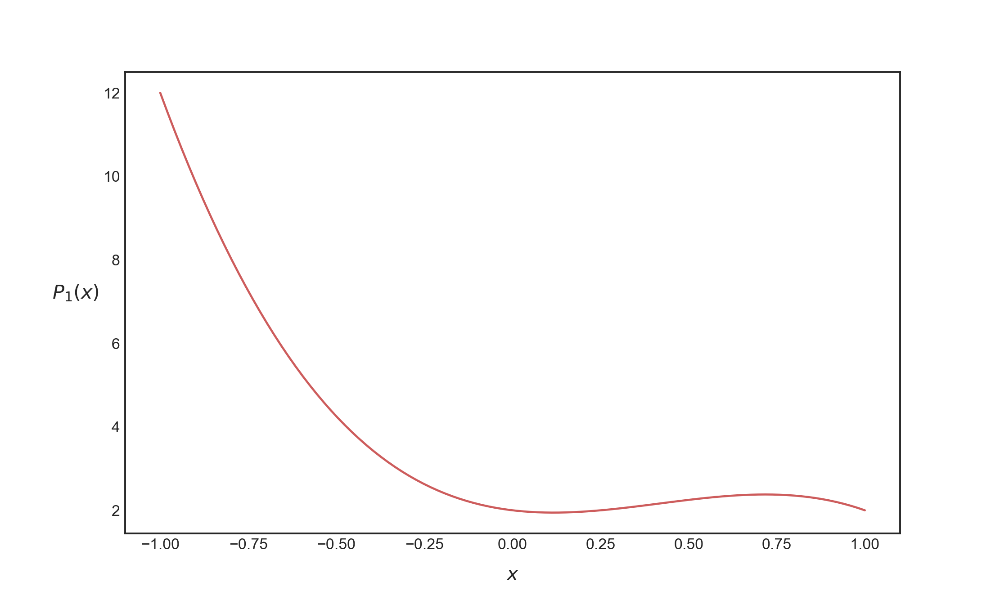

In [22]:
# Graficamos nuestro polinomio.
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(x, y, color="indianred")
ax.set_xlabel(r"$x$", fontsize=14, labelpad=10)
ax.set_ylabel(r"$P_{1}(x)$", fontsize=14, labelpad=20, rotation=0);

Las instancias de la clasde `Polynomial` puede, además, ser operadas aritméticamente de manera clásica, de la misma forma en que lo haríamos con arreglos de **Numpy**. La única diferencia es que el operador `//`, que es usado para la división entera entre elementos de un arreglo, al aplicarla sobre polinomios, se convertirá literalmente en una división algebraica de polinomios. Para comprobar esto, calcularemos la división entre los polinomios $P(x)$ y $Q(x)$, definidos como $Q(x)=(x-4)(x+5)(x-2)$ y $R(x)=x+5$. Al expresar los polinomios de esta manera, es evidente que el resultado de la división entre $Q$ y $R$ será $Q(x)/R(x)=(x-4)(x-2)=x^{2}-6x+8$. Comprobémoslo:

In [23]:
# Construimos los polinomios Q y R.
Q = P.Polynomial.fromroots([-5, 2, 4])
R = P.Polynomial.fromroots([-5])

In [24]:
# Realizamos la división entre Q y R.
Q // R

Polynomial([ 8., -6.,  1.], domain=[-1.,  1.], window=[-1.,  1.])

Lo que, efectivamente, comprueba nuestro cálculo.

La clase `Polynomial` también nos permite crear polinomios en otras bases no canónicas, pero que son igualmente ortogonales. Ejemplos de estas bases corresponden a la familia de polinomios ortogonales de Chebyshev, que pueden construirse a partir de la solución de la ecuación diferencial

$$\left( 1-x^{2}\right)  \frac{d^{2}y}{dx^{2}} -x\frac{dy}{dx} +n^{2}y=0$$
</p> <p style="text-align: right;">$(4.5)$</p>

Y que pueden definirse mediante la siguiente relación de recurrencia

$$T_{0}\left( x\right)  =1\  ;\  T_{1}\left( x\right)  =x\  ;\  T_{n+1}\left( x\right)  =2xT_{n}\left( x\right)  -T_{n-1}\left( x\right)$$
</p> <p style="text-align: right;">$(4.6)$</p>

Estos polinomios son ortogonales con respecto a la función de peso $w\left( x\right)  =\frac{1}{\sqrt{1-x^{2}} }$ en el intervalo $[-1, 1]$.

Cada uno de los polinomios de Chebyshev hasta de grado $n$ conforma las componentes de una base del conjunto $\mathbb{R}_{n}[x]$. Es posible usar esta base para construir polinomios en función de los polinomios de Chebyshev usando la clase `Chebyshev` del módulo `numpy.polynomial`. Por ejemplo, si escribimos `P.Chebyshev([1, 2, 3])`, obtendremos el polinomio $P(x)=1\cdot T_{0}(x)+2\cdot T_{1}(x)+3\cdot T_{2}(x)$:

In [25]:
# Nuestro primer polinomio de Chebyshev.
T = P.Chebyshev([1, 2, 3])

In [26]:
# Mostramos nuestro polinomio en pantalla.
T

Chebyshev([1., 2., 3.], domain=[-1,  1], window=[-1,  1])

Dada la forma en la cual construimos los polinomios anteriores, es posible construir cualquier polinomio de Chebyshev controlando los valores de cada una de las bases. Por ejemplo, si sólo usamos la base asociada a cada polinomio por dimensión, podremos construir $T_{n}(x)$ para cualquier valor de $n$:

In [27]:
# Polinomios de Chebyshev hasta grado 5.
T0 = P.Chebyshev([1])
T1 = P.Chebyshev([0, 1])
T2 = P.Chebyshev([0, 0, 1])
T3 = P.Chebyshev([0, 0, 0, 1])
T4 = P.Chebyshev([0, 0, 0, 0, 1])
T5 = P.Chebyshev([0, 0, 0, 0, 0, 1])

<IPython.core.display.Javascript object>


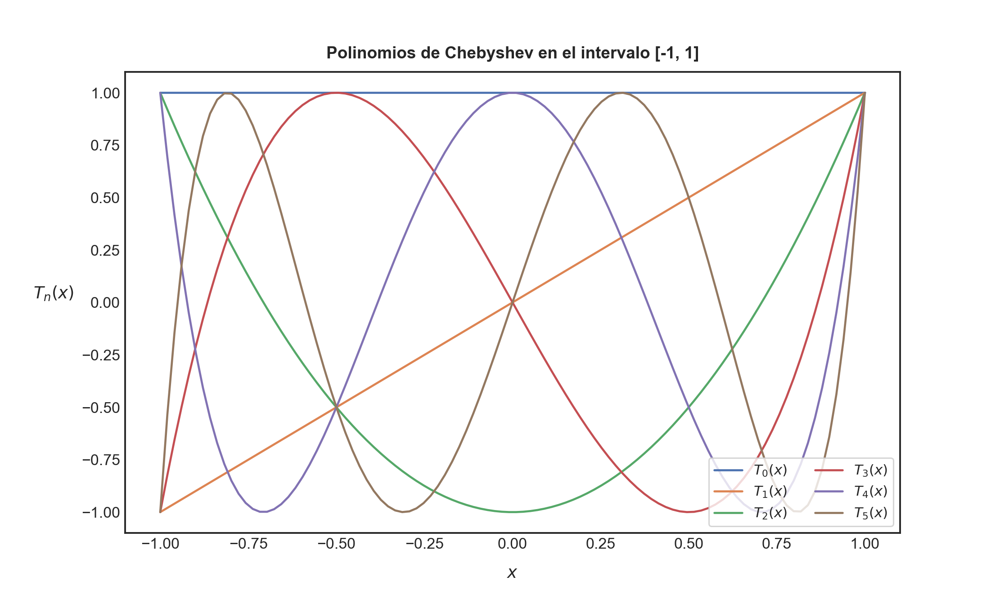

In [28]:
# Graficamos los polinomios de Chebyshev.
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(x, T0(x), label=r"$T_{0}(x)$")
ax.plot(x, T1(x), label=r"$T_{1}(x)$")
ax.plot(x, T2(x), label=r"$T_{2}(x)$")
ax.plot(x, T3(x), label=r"$T_{3}(x)$")
ax.plot(x, T4(x), label=r"$T_{4}(x)$")
ax.plot(x, T5(x), label=r"$T_{5}(x)$")
ax.set_xlabel(r"$x$", fontsize=12, labelpad=10)
ax.set_ylabel(r"$T_{n}(x)$", fontsize=12, labelpad=20, rotation=0)
ax.set_title(r"Polinomios de Chebyshev en el intervalo [-1, 1]", fontsize=12, fontweight="bold", pad=10)
ax.legend(loc="lower right", fontsize=10, frameon=True, ncol=2);

El módulo `numpy.polynomials` puede construir polinomios en base a cualquier base ortogonal. Existen varias opciones clásicas además de la definida a partir de los polinomios de Chebyshev. Por ejemplo, contamos con un constructor base para polinomios de Legendre (`Legendre`), Laguerre (`Laguerre`), Hermite (`Hermite` y `HermiteE`, para polinomios físicos y probabilísticos de Hermite, respectivamente). De esta manera, si escribimos `P.Laguerre([-1, 1, 2, 4])`, obtendremos un polinomio a partir de la expresión generadora $P(x)=-L_{0}(x)+L_{1}(x)+2L_{2}(x)+4L_{3}(x)$, donde $L_{n}(x)$ es el polinomio de Laguerre de grado $n$:

$$L_{n}\left( x\right)  =\frac{\exp \left( x\right)  }{n!} \frac{d^{n}}{dx^{n}} \left( x^{n}\exp \left( -x\right)  \right)$$
</p> <p style="text-align: right;">$(4.7)$</p>

En efecto:

In [29]:
# Nuestro primer polinomio de Laguerre.
L = P.Laguerre([-1, 1, 2, 4])

In [30]:
# Mostramos este polinomio.
L

Laguerre([-1.,  1.,  2.,  4.], domain=[0, 1], window=[0, 1])

Todos los constructores de polinomios en `numpy.polynomials` tienen los mismos métodos y atributos. De esta manera, de la misma forma que lo hicimos con instancias de tipo `Polynomial`, podemos usar la instancia `Chebyshev` o `Laguerre` para construir un polinomio a partir de un conjunto de raíces:

In [31]:
# Polinomios en las bases de Chebyshev y Laguerre, con raíces -1, 0, 1.
Pol1 = P.Chebyshev.fromroots([-1, 0, 1])
Pol2 = P.Laguerre.fromroots([-1, 0, 1])

In [32]:
Pol1

Chebyshev([ 0.  , -0.25,  0.  ,  0.25], domain=[-1.,  1.], window=[-1.,  1.])

In [33]:
Pol2

Laguerre([  5., -17.,  18.,  -6.], domain=[0., 1.], window=[0., 1.])

### Interpolación polinomial por medio de `numpy.polynomial`.
Los constructores de polinomios previamente comentados nos proveen de métodos útiles para la implementación de interpolaciones polinomiales. Por ejemplo, si recordamos la ecuación matricial que define a un problema general de interpolación, $\mathbf{\Phi } \left( \mathbf{x} \right)  \mathbf{c} =\mathbf{y}$, donde $\mathbf{x}$ y $\mathbf{y}$ son vectores que contienen los puntos $x_{i}$ e $y_{i}$, y $\mathbf{c}$ es el vector que contiene los coeficientes que deseamos determinar. Para resolver este problema, primero debemos evaluar la matriz $\mathbf{\Phi } \left( \mathbf{x} \right)$ para una base dada, y luego resolver el sistema de ecuaciones resultante. Cada una de las clases constructoras de polinomios del módulo `numpy.polynomial` nos provee convenientemente de una función para calcular la matriz (generalizada) de Vandermonde asociada a este sistema. Por ejemplo, para polinomios generados a partir de la base canónica $\left\{ 1,x,x^{2},...,x^{n}\right\}$, podemos usar la función `P.polynomial.polyvander()`; para polinomios generados a partir de la base ortogonal de Chebyshev, podemos usar la función `P.chebyshev.chebvander()`, y así sucesivamente.

El uso de los métodos anteriores para la construcción de matrices de Vandermonde nos permitirá construir interpolaciones polinomiales fácilmente conforme distintas bases ortogonales. Por ejemplo, consideremos los puntos $P_{0}=(-1, 1), P_{1}=(0, 3), P_{2}=(1, 6)$ y $P_{3}=(2, 4)$. Sobre tales puntos podemos construir un polinomio de interpolación de grado 3. Para ello, primero generamos arreglos de **Numpy** que se corresponderán con las abcisas y ordenadas de cada punto:

In [34]:
# Generamos los puntos o nodos de interpolación.
x = np.array([-1, 0, 1, 2])
y = np.array([1, 3, 6, 4])

Buscamos pues un polinomio de tercer grado, de la forma $P_{3}\left( x\right)  =\sum\nolimits^{3}_{i=0} c_{i}x^{i}$. Para ello, simplemente aplicamos el método de construcción de matrices de Vandermonde para construir el sistema de ecuaciones que nos permitirá determinar los coeficientes $c_{i}$:

In [35]:
# Grado del polinomio de interpolación.
n = x.shape[0] - 1

In [36]:
# Matriz de Vandermonde.
V = P.polynomial.polyvander(x, n)

Luego, usamos el módulo de álgebra lineal de **Scipy** (`scipy.linalg`) para resolver el sistema:

In [37]:
# Calculamos los coeficientes de nuestro polinomio de interpolación.
c = linalg.solve(V, y)

In [38]:
# Mostramos la solución del sistema (los coeficientes del polinomio).
c

array([ 3. ,  3.5,  0.5, -1. ])

Vemos pues que el polinomio de interpolación así determinado es $P_{3}=3+3.5x+0.5x^{2}-x^{3}$. Vamos a usar estos coeficientes para construir el polinomio en **Numpy** y comparar gráficamente su recorrido con los puntos de interpolación:

In [39]:
# Llevamos el polinomio a Numpy.
P3 = P.Polynomial(c)

<IPython.core.display.Javascript object>


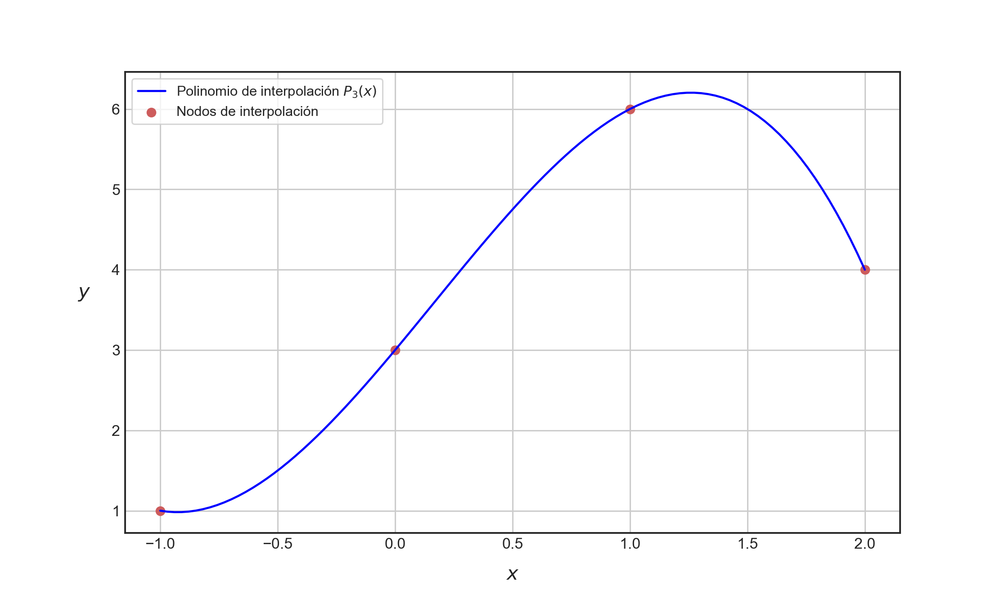

In [40]:
# Graficamos el polinomio y los puntos de interpolación.
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(
    np.linspace(-1, 2, 100), P3(np.linspace(-1, 2, 100)), 
    color="blue", label=r"Polinomio de interpolación $P_{3}(x)$"
)
ax.scatter(x, y, color="indianred", label="Nodos de interpolación")
ax.set_xlabel(r"$x$", fontsize=14, labelpad=10)
ax.set_ylabel(r"$y$", fontsize=14, labelpad=20, rotation=0)
ax.legend(fontsize=10, loc="upper left", frameon=True)
ax.grid(True);

Podemos observar que nuestro polinomio hace el trabajo que le pedimos de manera perfecta: Interpola sobre los nodos solicitados. Es posible hacer esto para polinomios definidos sobre cualquier base ortogonal. Por ejemplo, si quisiéramos construir un polinomio de interpolación definido sobre la base ortogonal de Chebyshev, digamos $U_{3}(x)$, bastará con:

In [41]:
# Matriz de Vandermonde definida sobre la base de los polinomios de Chebyshev.
A = P.chebyshev.chebvander(x, n)

In [42]:
# Calculamos los coeficientes de nuestro polinomio de interpolación.
d = linalg.solve(A, y)

In [43]:
# Mostramos la solución del sistema (los coeficientes del polinomio).
d

array([ 3.25,  2.75,  0.25, -0.25])

In [44]:
# Llevamos el polinomio a Numpy.
U3 = P.Chebyshev(d)

<IPython.core.display.Javascript object>


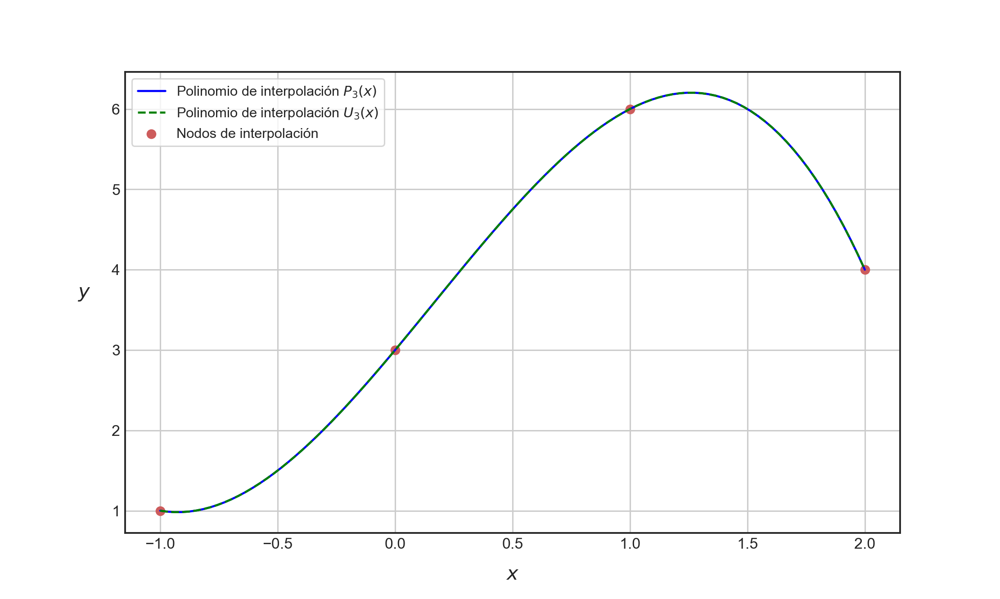

In [45]:
# Graficamos el polinomio y los puntos de interpolación.
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(
    np.linspace(-1, 2, 100), P3(np.linspace(-1, 2, 100)), 
    color="blue", label=r"Polinomio de interpolación $P_{3}(x)$"
)
ax.plot(
    np.linspace(-1, 2, 100), U3(np.linspace(-1, 2, 100)), 
    color="green", linestyle="--", label=r"Polinomio de interpolación $U_{3}(x)$"
)
ax.scatter(x, y, color="indianred", label="Nodos de interpolación")
ax.set_xlabel(r"$x$", fontsize=14, labelpad=10)
ax.set_ylabel(r"$y$", fontsize=14, labelpad=20, rotation=0)
ax.legend(fontsize=10, loc="upper left", frameon=True)
ax.grid(True);

Notemos que el polinomio de interpolación $U_{3}(x)$ es exactamente igual a $P_{3}(x)$, como lo indica nuestro gráfico anterior. Esto es un resultado esperado, puesto que como comentamos al principio, el polinomio de interpolación es único.

La metodología de interpolación presentada previamente, si bien cumple perfectamente con su función, en general no es muy utilizada en la práctica. La razón de aquello estriba en el hecho de que, para un número elevado de nodos de interpolación, el sistema resultante tiene un número de condición muy elevado, lo que puede inducir a errores indeseables en la determinación de los coeficientes del polinomio de interpolación, independientemente de la base que escojamos. Por esa razón, cada una de las clases que define polinomios en `numpy.polynomial` viene equipada con un método `fit()` que permite construir eficientemente polinomios de interpolación para un número arbitrario de nodos. Y que, naturalmente, nos llevan a los mismos resultados que si aplicáramos el método basado en las matrices de Vandermonde:

In [46]:
# Interpolación directa mediante el método fit() en la base canónica.
P3_fit = P.Polynomial.fit(x, y, n)

In [47]:
# Mostramos el polinomio resultante.
P3_fit

Polynomial([ 4.75 ,  4.875, -2.25 , -3.375], domain=[-1.,  2.], window=[-1.,  1.])

El método de ajuste anterior es aplicable a cualquier base:

In [48]:
# Interpolación directa mediante el método fit() en la base ortogonal de Chebyshev.
U3_fit = P.Chebyshev.fit(x, y, n)

In [49]:
# Interpolación directa mediante el método fit() en la base ortogonal de Hermite.
H3_fit = P.Hermite.fit(x, y, n)

In [50]:
# Mostramos los polinomios resultantes.
print(f"Polinomio interpolador de Chebyshev: {U3_fit}")
print(f"Polinomio interpolador de Hermite: {H3_fit}")

Polinomio interpolador de Chebyshev: 3.6250000000000004 + 2.34375·T₁(x) - 1.1250000000000002·T₂(x) -
0.8437499999999997·T₃(x)
Polinomio interpolador de Hermite: 3.6250000000000004 - 0.09374999999999918·H₁(x) - 0.562500000000001·H₂(x) -
0.4218749999999996·H₃(x)


Notemos que, con este método de ajuste polinomial, el atributo `domain` de las instancias resultantes se setea automáticamente de valores apropiados de $x$, independientemente de las bases utilizadas:

In [51]:
# Dominios de los polinomios interpoladores ajustados.
print(f"Dominio en base canónica: {P3_fit.domain}")
print(f"Dominio en base de Chebyshev: {U3_fit.domain}")
print(f"Dominio en base de Hermite: {H3_fit.domain}")

Dominio en base canónica: [-1.  2.]
Dominio en base de Chebyshev: [-1.  2.]
Dominio en base de Hermite: [-1.  2.]


**Ejemplo 4.2 - El fenómeno de Runge:** La interpolación polinomial resulta ser una herramienta que viene muy bien para generar ajustes sobre conjuntos de puntos no tan numerosos. Cuando el número de puntos aumenta, se hace necesario aumentar el orden de los polinomios de interpolación en la misma proporción. Esto da lugar a ciertos problemas que, en términos gráficos, dan lugar a comportamientos oscilatorios cuando el grado de tales polinomios crece a gran magnitud. Para ejemplificar este efecto, consideremos la *función de Runge*, definida como

$$f\left( x\right)  =\frac{1}{1+25x^{2}}$$
</p> <p style="text-align: right;">$(4.8)$</p>

Esta función fue utilizada por el matemático alemán [Carl Runge](https://en.wikipedia.org/wiki/Carl_Runge) para ilustrar el llamado **fenómeno de Runge**, en el cual, al interpolar la función de Runge en $n$ puntos equidistantes $x_{i}$ en el intervalo $[-1, 1]$, tales que $x_{i}=\frac{2i}{n}-1$ ($i=0, 1, 2, .., n$), mediante un polinomio $P_{n}(x)$ de grado $n$, dicho polinomio presenta un comportamiento notablemente oscilatorio al aproximarse a los extremos de dicho intervalo. Podemos probar algebraicamente que el error de interpolación se incrementa (de manera no acotada) cuando el grado del polinomio de interpolación se incrementa:

$$\lim_{n\rightarrow +\infty } \left( \sup_{-1\leq x\leq 1} \left| f\left( x\right)  -P_{n}\left( x\right)  \right|  \right)  =+\infty$$
</p> <p style="text-align: right;">$(4.9)$</p>

Dicho de otro modo, la interpolación mediante polinomios de alto grado puede resultar problemática. En efecto, si definimos la función de Runge en Python e intentamos generar una interpolación de orden superior a 10, comenzaremos a notar las oscilaciones resultantes de los polinomios en los extremos del intervalo $[-1, 1]$:

In [52]:
# Definimos la función de Runge.
def runge(x):
    return 1 / (1 + 25*x**2)

In [53]:
# Definimos una función que interpolará los nodos resultantes de la evaluación de la función
# de Runge mediante un polinomio de grado n (en la base canonica).
def runge_interpolation(n):
    x = np.linspace(start=-1, stop=1, num=n+1)
    p = P.Polynomial.fit(x, runge(x), n)
    return x, p

<IPython.core.display.Javascript object>


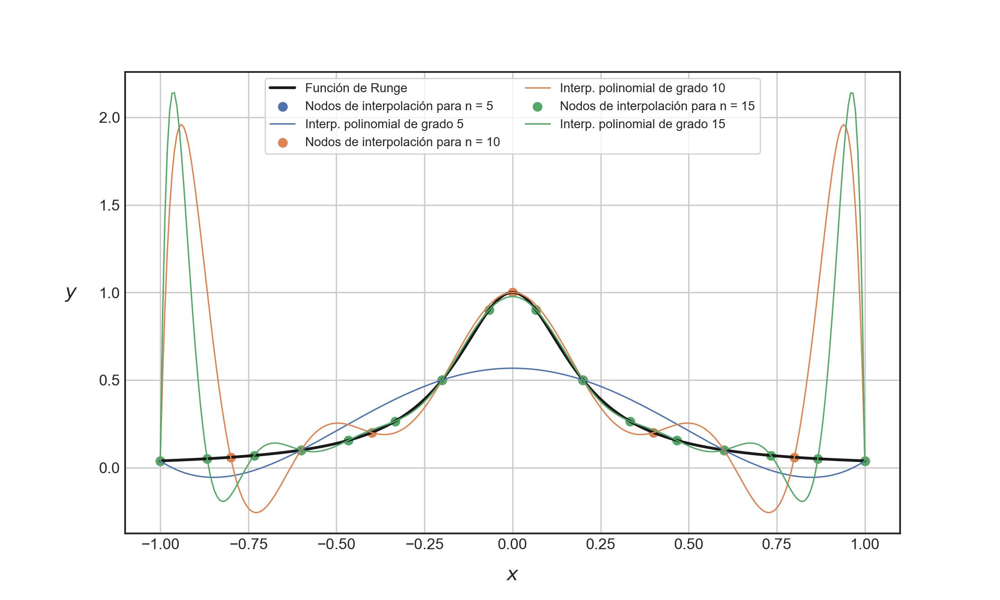

In [54]:
# Graficamos las interpolaciones.
x_range = np.linspace(start=-1, stop=1, num=300)

fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(x_range, runge(x_range), color="k", lw=2, label="Función de Runge")

# Verificaremos las interpolaciones de grado 5, 10 y 15.
for n in [5, 10, 15]:
    xi, pi = runge_interpolation(n)
    ax.scatter(xi, runge(xi), marker="o", label=f"Nodos de interpolación para n = {n}")
    ax.plot(x_range, pi(x_range), lw=1, label=f"Interp. polinomial de grado {n}")

ax.set_xlabel(r"$x$", fontsize=14, labelpad=10)
ax.set_ylabel(r"$y$", fontsize=14, labelpad=20, rotation=0)
ax.legend(fontsize=9, loc="upper center", frameon=True, ncol=2)
ax.grid(True);

Este fenómeno ocurre debido, entre otras cosas, a que la magnitud de las derivadas de $f$ también crece a medida que $n$ se hace más grande. ◼

## Interpolación por splines.
Queda claro, dados los resultados del Ejemplo 4.2, que la interpolación polinomial indudablemente presenta límites en su aplicación: A medida que la cantidad de nodos de interpolación crece, la representatividad de los polinomios de interpolación decrece. Por lo tanto, se hacen necesarios otros métodos que no presenten este problema. Y es aquí donde se hace patente la potencia de la **interpolación por splines**, que ya vimos muy brevemente al estudiar el análisis de registros vacíos (o `nan`) en **Pandas**.

### Conceptualización.
Un **spline** se define como una función que se define a trozos, intervalo por intervalo, donde cada uno de estos trozos representa un polinomio de grado determinado. Se trata pues de una función definida a intervalos y que, dada su naturaleza, es preferible en los problemas de interpolación debido a que no presenta los problemas devenidos del fenómeno de Runge, ya que en la mayoría de los casos, los splines de grado 3 serán suficientes para aproximar cualquier función con el error deseado.

Empezaremos nuestra discusión considerando únicamente polinomios de una variable. En este caso, formalmente, un spline se definirá como una función univariable que corresponde a una cierta cantidad de polinomios definidos a intervalos. Esta función, que será llamada $S$, toma valores de un intervalo cerrado $[a, b]$ y los aplica en $\mathbb{R}$; es decir, $S:\left[ a,b\right]  \longrightarrow \mathbb{R}$. Como queremos que $S$ esté definida por intervalos, particionamos $[a, b]$ en sub-intervalos disjuntos del tipo

$$\begin{array}{l}\left[ t_{i},t_{i+1}\right]  ,i=0,1,...,k-1\\ \left[ a,b\right]  =\left[ t_{0},t_{1}\right)  \cup \left[ t_{1},t_{2}\right)  \cup \cdots \cup \left[ t_{k-2},t_{k-1}\right)  \cup \left[ t_{k-1},t_{k}\right)  \cup \left[ t_{k}\right]  \\ a=t_{0}\leq t_{1}\leq \cdots \leq t_{k-1}\leq t_{k}=b\end{array}$$
</p> <p style="text-align: right;">$(4.10)$</p>

Sobre cada una de estas $k$ particiones o "piezas" del intervalo $[a, b]$, queremos definir un polinomio $P_{i}:[t_{i},t_{i+1}]\longrightarrow \mathbb{R}$, el permite definir al spline $S$ completo como

$$\begin{array}{lll}S\left( t\right)  &=&P_{0}\left( t\right)  ,\  t_{0}\leq t<t_{1}\\ S\left( t\right)  &=&P_{1}\left( t\right)  ,\  t_{1}\leq t<t_{2}\\ \vdots &&\\ S\left( t\right)  &=&P_{k-1}\left( t\right)  ,\  t_{k-1}\leq t\leq t_{k}\end{array}$$
</p> <p style="text-align: right;">$(4.11)$</p>

Los $k+1$ puntos dados sobre los cuales se realiza la interpolación son llamados **nodos**. El vector $\mathbf{t}=(t_{0},...,t_{k})$ es llamado **vector nodal** del spline. Si los nodos son equidistantes, diremos que el spline es **uniforme** en $[a, b]$. Si los polinomios que definen los trozos del spline tienen grado al menos $n$, diremos que el spline es, consecuentemente, de grado al menos $n$ (o bien, de orden $n+1$).

Si cada uno de los polinomios que constituyen el spline es de clase, al menos, $C^{r_{i}}$, en la partición $[t_{i-1},t_{i})$, entonces diremos que el spline es **regular** en todo $[a, b]$.

### Implementación en `scipy.interpolate`.
El módulo `scipy.interpolate` nos provee de varias funciones y clases para implementar interpolaciones mediante el uso de splines. Una de ellas corresponde a la función `interp1d()`, la cual toma como argumentos obligatorios los arreglos `x` e `y` que representan los $n+1$ nodos de interpolación $(x_{i},y_{i})_{i=0}^{n}$. Un parámetro opcional es `kind`, y que corresponde al tipo de interpolación que se implementará por medio de esta función. Para una interpolación por medio de splines, bastará con setear `kind` en `"zero"`, `"linear"`, `"quadratic"` o `"cubic"`, dependiendo si queremos construir splines de orden 0, 1, 2 o 3, respectivamente.

Vamos a usar la función de Runge construida previamente para comparar los resultados obtenidos previamente mediante la interpolación polinomial, con los que obtendremos utilizando splines cúbicos. Usaremos como base un total de 12 nodos de interpolación:

In [55]:
# Generamos los nodos de interpolación.
x = np.linspace(start=-1, stop=1, num=12)
y = runge(x)

In [56]:
# Y aplicamos la interpolación por splines cúbicos.
s = interpolate.interp1d(x, y, kind="cubic")

<IPython.core.display.Javascript object>


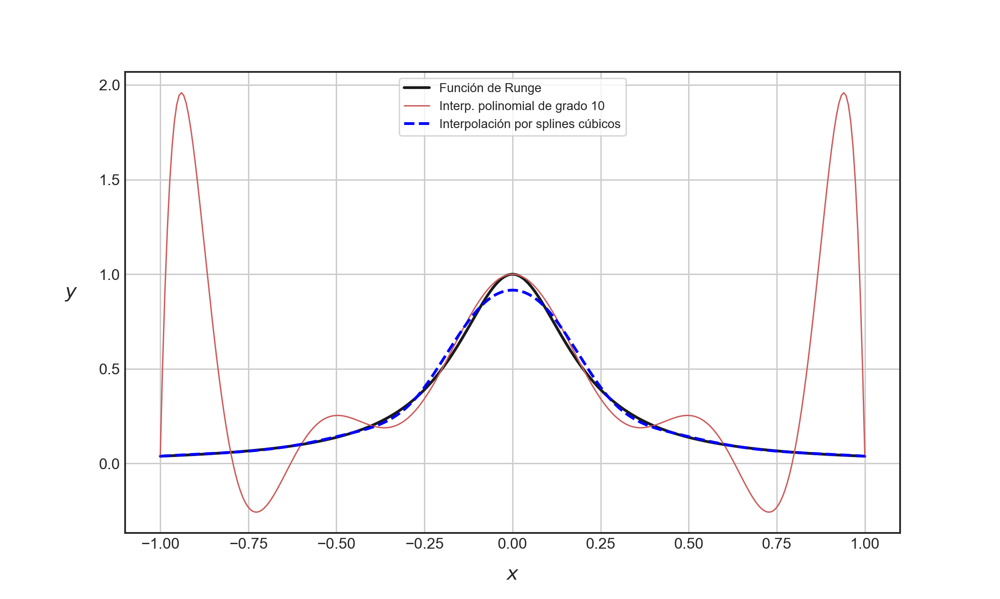

In [57]:
# Y graficamos los resultados.
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(x_range, runge(x_range), color="k", lw=2, label="Función de Runge")

xp, p = runge_interpolation(n=10) # Interpolación polinomial de orden 10.
ax.plot(x_range, p(x_range), lw=1, color="indianred", label="Interp. polinomial de grado 10")
ax.plot(x_range, s(x_range), lw=2, linestyle="--", color="blue", label="Interpolación por splines cúbicos")

ax.set_xlabel(r"$x$", fontsize=14, labelpad=10)
ax.set_ylabel(r"$y$", fontsize=14, labelpad=20, rotation=0)
ax.legend(fontsize=9, loc="upper center", frameon=True)
ax.grid(True);

Si bien nuestro spline no es perfecto, sí hace un muy buen trabajo aproximando la función de Runge, y sin sufrir de los problemas de oscilación que ocurren en el caso de la interpolación polinomial de alto grado. Además, es una implementación sumamente eficiente, mucho más rápida que la interpolación por medio de matrices de Vandermonde que construimos previamente:

In [58]:
%timeit runge_interpolation(n=10)
%timeit interpolate.interp1d(x, y, kind="cubic")

214 µs ± 18.3 µs per loop (mean ± std. dev. of 7 runs, 1,000 loops each)
116 µs ± 2.36 µs per loop (mean ± std. dev. of 7 runs, 10,000 loops each)


Para ilustrar el efecto del grado asociado al spline interpolador, generaremos un gráfico donde apreciaremos, para el mismo conjunto de puntos, las geometrías asociadas a splines lineales, cuadráticos y cúbicos. Los puntos, en este caso, serán las salidas de la función sinusoidal

$$f(x)=A\cos(\omega x+\phi)$$
</p> <p style="text-align: right;">$(4.12)$</p>

Donde $A, \omega$ y $\phi$ son parámetros libres. Pondremos $A=10, \omega=3\pi /2$ y $\phi=\pi/4$ y definiremos dicha función en Python:

In [59]:
# Función sinusoidal en Python.
def sinusoidal(x, A=10, omega=3*np.pi/2, phi=np.pi/4):
    return A * np.cos(omega*x + phi)

In [60]:
# Definimos los nodos de interpolación en el intervalo [-1, 1].
x_nodes = np.linspace(start=-1, stop=1, num=10)

In [61]:
# Implementamos las interpolaciones.
s1 = interpolate.interp1d(x_nodes, sinusoidal(x_nodes), kind="linear")
s2 = interpolate.interp1d(x_nodes, sinusoidal(x_nodes), kind="quadratic")
s3 = interpolate.interp1d(x_nodes, sinusoidal(x_nodes), kind="cubic")

<IPython.core.display.Javascript object>


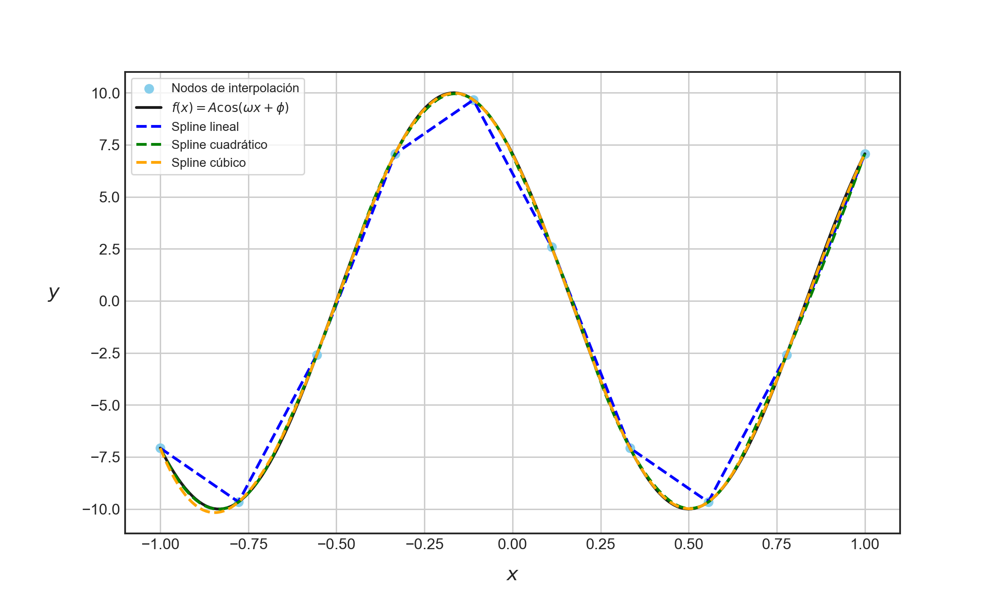

In [62]:
# Y graficamos los splines.
x_range = np.linspace(start=-1, stop=1, num=200)

fig, ax = plt.subplots(figsize=(10, 6))
ax.scatter(x_nodes, sinusoidal(x_nodes), color="skyblue", label="Nodos de interpolación")
ax.plot(x_range, sinusoidal(x_range), color="k", lw=2, label=r"$f(x)=A\cos(\omega x+\phi)$")
ax.plot(x_range, s1(x_range), lw=2, linestyle="--", color="blue", label="Spline lineal")
ax.plot(x_range, s2(x_range), lw=2, linestyle="--", color="green", label="Spline cuadrático")
ax.plot(x_range, s3(x_range), lw=2, linestyle="--", color="orange", label="Spline cúbico")

ax.set_xlabel(r"$x$", fontsize=14, labelpad=10)
ax.set_ylabel(r"$y$", fontsize=14, labelpad=20, rotation=0)
ax.legend(fontsize=9, loc="upper left", frameon=True)
ax.grid(True);

Y ahí lo tenemos. Podemos observar que, para este ejemplo particular, bastaba con un spline cuadrático para lograr una aproximación de enorme calidad para nuestra función sinusoidal.

**Ejemplo 4.3 - Efecto de la curvatura de un frente de hundimiento en el estado tensional de la periferia de una cavidad:** Un aspecto interesante de la minería de hundimiento masiva corresponde al efecto que produce su geometría en la periferia de una cavidad resultante del progreso de la actividad minera. La concentración de esfuerzos por delante del frente de hundimiento es función tanto de su longitud como de su geometría, siendo ésta última esencial en el efecto generado por tales esfuerzos en el macizo rocoso ubicado en esta zona. Para efectos prácticos (Karzulovic, 2006), es posible determinar un coeficiente que permite corregir la magnitud del esfuerzo vertical sobre una región determinada en el entorno del frente considerando el efecto de dicha geometría en términos de su curvatura.

La curvatura es un concepto matemático que describe la propiedad que tiene toda curva en términos de qué tan rápido cambia de orientación en el entorno de un punto perteneciente a ella. Suele denotarse como $\kappa$. En términos geométricos, la curvatura guarda relación con el radio del máximo circulo osculador a una curva en un punto determinado, para el cual dicho radio se conoce como radio de curvatura. Nos permite establecer el nivel de concavidad de una curva con referencia tanto a un punto como a un conjunto de puntos, tal y como se observa en la Fig. (4.1).

<p style="text-align: center;"><img src="figures/fig_4_1.png" width="800"></p>
<p style="text-align: center;">Fig. (4.1): Esquema que ilustra la curvatura de una curva plana en tres referencias distintas. Mientras mayor área tenga el círculo osculador a la curva en el punto de referencia, menor será la magnitud de dicha curvatura y, por tanto, mayor será el radio de curvatura</p>

Por supuesto, una curva, además, puede tener diferentes orientaciones referidas a los cambios de dirección de las rectas tangentes en puntos determinados. Por esa razón, se suele definir el siguiente criterio:

- Si $\kappa > 0$, la curva se dirá cóncava (o de curvatura positiva).
- Si $\kappa < 0$, la curva se dirá convexa (o de curvatura negativa).
- Si $\kappa = 0$, la curva se dirá plana (unidireccional o de curvatura nula).

Dada la relación geométrica mostrada en la Fig. (4.1), es evidente que la curvatura de una curva es inversamente proporcional al radio de curvatura. Y no sólo eso, son recíprocos el uno del otro. Por esa razón, si una curva se describe mediante una trayectoria del tipo $\mathbf{r} :\left[ a,b\right]  \longrightarrow \mathbb{R}^{n}$, entonces la curvatura local $\kappa_{k}(t)$ en un punto $P_{k}=(x_{k}(t), y_{k}(t))$ puede definirse como

$$\kappa_{k} \left( t\right)  =\frac{1}{R_{k}\left( t\right)  }$$
</p> <p style="text-align: right;">$(4.13)$</p>

Evidentemente, debido a la dependencia de la curvatura de una curva de la rapidez de variación del respectivo vector tangente $\mathbf{\hat{T}}(t)$ a la curva en términos locales, es claro que, para que la curvatura esté bien definida, la curva debe ser regular. Es decir, no tener vértices. Matemáticamente, esto se verifica exigiendo que toda trayectoria $\mathbf{r} :\left[ a,b\right]  \longrightarrow \mathbb{R}^{2}$ que recorra dicha curva sea tal que su derivada $d\mathbf{r}/dt$ sea distinta de cero en todo $[a,b]$; es decir, que la curva descrita por $\mathbf{r}$ sea regular. Por tanto, trayectorias tales como las líneas poligonales no pueden ser sujeto del cálculo de curvaturas de forma directa.

Los frentes de hundimiento, por su referencia en términos de la dirección de las galerías de hundimiento y los polígonos que definen las tronaduras de hundimiento propiamente tales, constituyen líneas poligonales que no cumplen con la restricción anterior. Sin embargo, es posible someter tales líneas a un proceso de interpolación que permita suavizarlas y dejarlas aptas para el cálculo de valores de curvatura respectivos. Por supuesto, esto genera errores de estimación razonables de esta propiedad, pero constituyen la única forma posible de contar con un único número que describa su geometría. De esta manera, se construyen los casos posibles de distribución de esfuerzos en función de la concavidad de un frente que se observan en la Fig. (4.2).

<p style="text-align: center;"><img src="figures/fig_4_2.png" width="700"></p>
<p style="text-align: center;">Fig. (4.2): Geometrías suavizadas del frente de hundimiento que representan las diferentes condiciones de esfuerzos que pueden suscitarse en función de su curvatura</p>

Se define un **frente de hundimiento cóncavo** como aquel cuya curvatura, en términos generales, es positiva. Por lo tanto, el macizo rocoso es exterior al círculo osculador del frente de hundimiento, lo que genera un estado tensional tal que éste permite aumentar el grado de confinamiento del macizo rocoso periférico por delante de este frente. Por otro lado, se define un **frente de hundimiento convexo** como aquel cuya curvatura, en términos generales, es negativa. Así, en este caso, el macizo rocoso es interior al círculo de curvatura del frente de hundimiento, lo que genera un estado tensional tal que éste permite aumentar el grado de desconfinamiento del macizo rocoso periférico por delante de este frente.

No obstante lo anterior, puede suceder que un frente tenga curvatura prácticamente nula. En este caso, se habla de un frente plano. Dicha condición puede llegar a ser desfavorable para el macizo rocoso periférico por delante de dicho frente, puesto que el estado tensional es tal que el esfuerzo requerido para mantener un medio material continuo aumenta en forma directamente proporcional a la longitud de dicho frente, debido que los bloques de roca que conforman el macizo rocoso tienen un mayor grado de libertad para poder desplazarse.

Después de esta (quizás un poco larga) introducción, ya estamos listos para ejemplificar lo anterior mediante un caso de estudio sencillo. Estamos interesados en determinar la curvatura asociada a un frente de hundimiento descrito por una serie de líneas poligonales, cuyos vértices se han registrado en el archivo `cavelines.csv`:

In [63]:
# Accedemos a nuestro archivo.
data = pd.read_csv("datasets/cavelines.csv", sep=";")

<IPython.core.display.Javascript object>


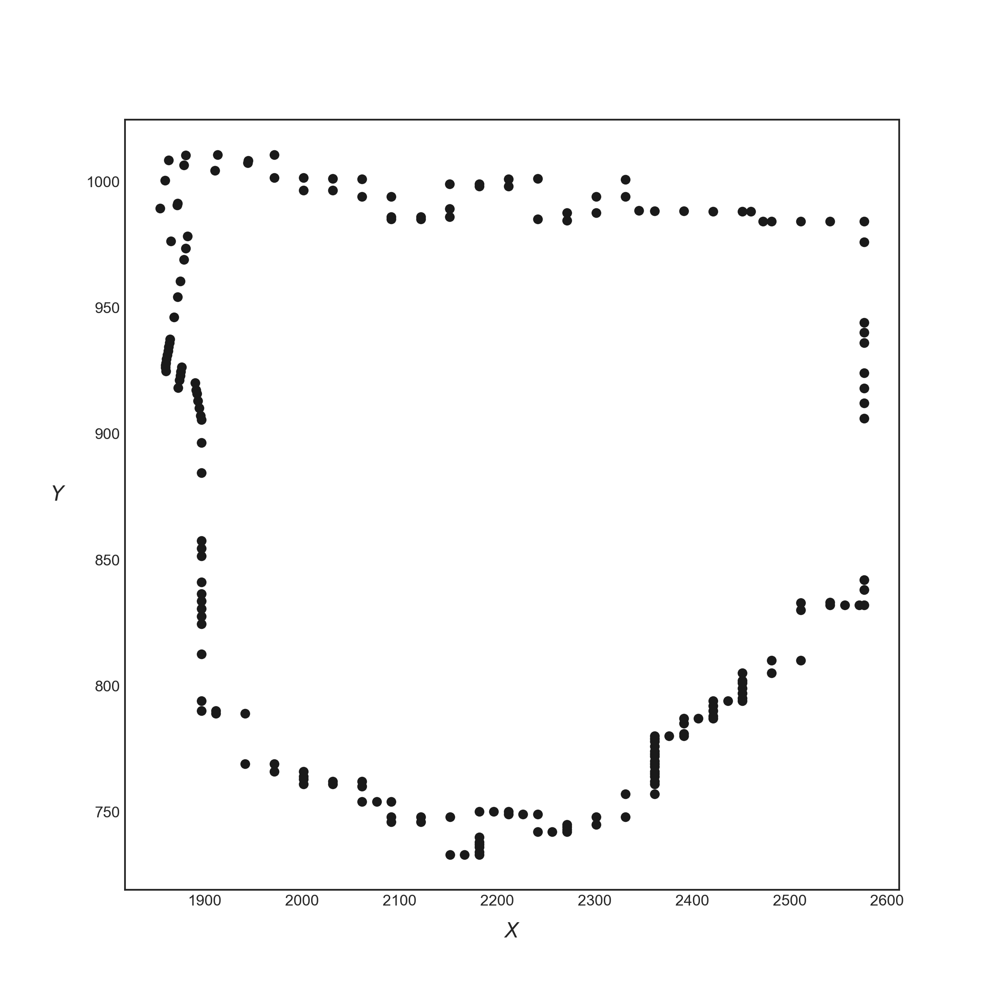

In [64]:
# Graficamos la situación espacial de estos puntos.
fig, ax = plt.subplots(figsize=(10, 10))
ax.scatter(data["X"], data["Y"], marker="o", color="k")
ax.set_xlabel(r"$X$", labelpad=10, fontsize=15)
ax.set_ylabel(r"$Y$", labelpad=20, fontsize=15, rotation=0);

Queremos obtener el radio de curvatura asociado a cada uno de los puntos que caracterizan este frente de hundimiento. Para ello, debemos considerar que la curvatura de una curva plana representada por la trayectoria $\mathbf{r}:[a, b]\longrightarrow \mathbb{R}^{2}$, definida explícitamente como $\mathbf{r}(t)=(x(t),y(t))$, donde $x,y:[a, b]\longrightarrow \mathbb{R}$ son funciones de clase $C^{2}$ en $[a, b]$, puede calcularse como

$$\kappa \left( t_{0}\right)  =\frac{\frac{dx\left( t_{0}\right)  }{dt} \frac{d^{2}y\left( t_{0}\right)  }{dt^{2}} -\frac{d^{2}x\left( t_{0}\right)  }{dt^{2}} \frac{dy\left( t_{0}\right)  }{dt} }{\left[ \left( \frac{dx\left( t_{0}\right)  }{dt} \right)^{2}  +\left( \frac{dy\left( t_{0}\right)  }{dt} \right)^{2}  \right]^{3/2}  } =\frac{x^{\prime }\left( t_{0}\right)  y^{\prime \prime }\left( t_{0}\right)  -x^{\prime \prime }\left( t_{0}\right)  y^{\prime }\left( t_{0}\right)  }{\left[ \left( x^{\prime }\left( t_{0}\right)  \right)^{2}  +\left( y^{\prime }\left( t_{0}\right)  \right)^{2}  \right]^{3/2}  }$$
</p> <p style="text-align: right;">$(4.13)$</p>

Hay varias formas de proceder para calcular las derivadas involucradas en este problema. Nosotros procederemos de manera sencilla, estimando numéricamente las derivadas involucradas mediante el uso de diferencias finitas del tipo

$$x'(t)=\frac{x(t+h)-x(t-h)}{2h}$$
</p> <p style="text-align: right;">$(4.14)$</p>

Donde $h$ es el tamaño del paso que tomamos en el cálculo de dicha diferencia. Por otro lado, las derivadas de segundo orden también las calcularemos usando diferencias finitas, por medio de la fórmula centrada 

$$x^{\prime \prime }\left( t\right)  =\frac{x\left( t+h\right)  -2x\left( t\right)  +x\left( t-h\right)  }{h^{2}} $$
</p> <p style="text-align: right;">$(4.15)$</p>

Separamos entonces las coordenadas $X$ e $Y$ a partir del DataFrame anterior, ordenándolas en el proceso:

In [65]:
# Ordenamos nuestras coordenadas conforme los valores de X.
data.sort_values("X", ascending=True, inplace=True)
data.reset_index(inplace=True)

# Generamos los arreglos x e y.
x, y = data["X"].values, data["Y"].values

Para el caso de nuestro frente de hundimiento, debemos tener en consideración que la curva resultante de la unión de todos los nodos es cerrada. Por lo tanto, es completamente esperable que existan valores de `x` o de `y` que se encuentren duplicados. Y, por extensión, no podemos simplemente eliminar dichos valores. El spline que construiremos debe ser tal que se permita construir curvas cerradas, y lamentablemente la función `interp1d()` no permite la imputación de valores duplicados. Sin embargo, podemos *engañar* a esta función si definimos la curva que recorrerá los puntos $(x, y)$ en términos de un parámetro $t$, aunque ésto conducirá a errores significativos por arrastre, ya que los puntos resultantes $(x(t), y(t))$ serán resultado de la evaluación de los splines, y por supuesto estarán sujetos a un error (aunque nos ocuparemos de los puntos *más alejados* después):

In [66]:
# Creamos un parámetro t que recorrerá todos los puntos.
t = np.arange(start=0, stop=x.shape[0])

In [67]:
# Ahora creamos los splines, también de forma paramétrica.
Sx = interpolate.interp1d(t, x, kind="cubic")
Sy = interpolate.interp1d(t, y, kind="cubic")

A continuación crearemos una función que calculará el radio de curvatura y la curvatura de la curva resultante a partir de los splines. También incluiremos, por propósitos meramente didácticos, el cálculo del centro de curvatura, que corresponde a las coordenadas $(x_{c},y_{c})$ del círculo osculador (tangente) a la curva en el punto donde se evalúa la curvatura, y cuyo radio corresponde al radio de curvatura:

$$\left( x_{c},y_{c}\right)  =\left( x\left( t\right)  -\frac{R_{c}y^{\prime }\left( t\right)  }{\left( x^{\prime }\left( t\right)  \right)^{2}  +\left( y^{\prime }\left( t\right)  \right)^{2}  } ,y\left( t\right)  -\frac{R_{c}x^{\prime }\left( t\right)  }{\left( x^{\prime }\left( t\right)  \right)^{2}  +\left( y^{\prime }\left( t\right)  \right)^{2}  } \right)$$
</p> <p style="text-align: right;">$(4.16)$</p>

In [68]:
# Importamos algunos objetos de typing para documentar correctamente nuestra función de curvatura.
from typing import Tuple

In [69]:
# A continuación, craremos una función que calculará la curvatura, el radio de curvatura y los
# correspondientes centros de curvatura cada tres puntos.
def curvature(
    Sx: interpolate.interp1d, 
    Sy: interpolate.interp1d, 
    t: np.ndarray, 
    h: float=1e-5
) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    """
    Función que permite calcular la curvatura de una curva a partir de su representación
    paramétrica por medio de splines. Las derivadas involucradas en el cálculo de la 
    curvatura se estiman por medio de diferencias finitas de tipo centradas.
    
    Parámetros:
    -----------
    Sx : Spline de scipy.interpolate que representa el recorrido de las abscisas x(t).
    Sy : Spline de scipy.interpolate que representa el recorrido de las ordenadas y(t).
    t : Parámetro libre.
    h : Tamaño del paso para la estimación de las derivadas.
    
    Retorna:
    --------
    curvature : Arreglo de Numpy con los valores calculados para la curvatura.
    radius_of_curvature : Arreglo de Numpy con los valores calculados para el radio de curvatura.
    centers : Arreglo de Numpy con las coordenadas (x, y) del centro de curvatura.
    
    """
    # Recorreremos la curva hasta su penúltimo nodo.
    t_ = t[:-1]
    
    # Caracterizamos las funciones x(t) e y(t).
    x, x1, x2 = Sx(t), Sx(t - h), Sx(t + h)
    y, y1, y2 = Sy(t), Sy(t - h), Sy(t + h)
    
    # Calculamos las derivadas x'(t) e y'(t).
    dx = (x2 - x1) / (2*h)
    dy = (y2 - y1) / (2*h)
    
    # Calculamos las derivadas x''(t) e y''(t).
    d2x = (x2 - 2*x + x1) / (h**2)
    d2y = (y2 - 2*y + y1) / (h**2)
    
    # Calculamos la curvatura en todos los nodos.
    curvature = (dx*d2y - dy*d2x) / np.power(dx**2 + dy**2, 1.5)
    
    # Calculamos el radio de curvatura en todos los nodos.
    radius_of_curvature = 1 / curvature
    
    # Calculamos los centros de curvatura en todos los nodos.
    Xc = x[:-1] + radius_of_curvature[:-1] * (dy[:-1] / np.sqrt(dx[:-1] ** 2 + dy[:-1] ** 2))
    Yc = y[:-1] - radius_of_curvature[:-1] * (dx[:-1] / np.sqrt(dx[:-1] ** 2 + dy[:-1] ** 2))
    
    # Generamos un único arreglo con las coordenadas de cada centro de curvatura.
    centers = np.column_stack((Xc, Yc))
    
    return curvature, radius_of_curvature, centers

Y ya podemos calcular estos parámetros:

In [70]:
# Generamos entonces nuestro parámetro libre t.
t_new = np.linspace(start=t.min() + 1e-5, stop=t.max() - 1e-5, num=x.shape[0])

In [71]:
# Calculamos los parámetros de curvatura.
curvature, radius_of_curvature, centers = curvature(Sx=Sx, Sy=Sy, t=t_new)

In [72]:
# Evaluamos los splines.
x_new, y_new = Sx(t_new), Sy(t_new)

In [73]:
# Reunimos nuestros resultados en un DataFrame.
curv_data = np.column_stack((x_new, y_new, curvature, radius_of_curvature))
curv_data = pd.DataFrame(
    data=curv_data,
    columns=["X", "Y", "Curvatura", "Radio de Curvatura"]
)

Hay una cantidad no menor de puntos donde hemos evaluado los splines que se encuentran alejados del frente de hundimiento original debido a la parametrización que hemos realizado. Para quedarnos únicamente con aquellos puntos de interés, aplicaremos el algoritmo de K-vecinos más cercanos, usando exactamente la misma formulación que implementamos cuando aprendimos las funcionalidades de **Numpy**, a fin de encontrar todos los puntos generados por los splines paramétricos más cercanos a los originales, poniendo $K=2$:

In [74]:
# Generaremos una matriz con las distancias entre los puntos.
d_matrix = np.zeros((data.shape[0], curv_data.shape[0]))
d_matrix = pd.DataFrame(d_matrix, index=data.index, columns=curv_data.index)
for i in data.index:
    for j in curv_data.index:
        d_ij = np.sqrt(
            (
                data.loc[i, "X"] - curv_data.loc[j, "X"]
            )**2 + (
                data.loc[i, "Y"] - curv_data.loc[j, "Y"]
            )**2
        )
        d_matrix.loc[i, j] = d_ij

In [75]:
# Determinamos las posiciones asociadas a los valores más cercanos a los originales.
nearest = np.argsort(d_matrix, axis=1)

In [76]:
# Particionamos la matriz de distancias a fin de quedarnos con los vecinos más cercanos interpolados
# con respecto a los nodos originales del frente de hundimiento.
K = 2
nearest_partition = np.argpartition(d_matrix, K + 1, axis=1)

In [77]:
# Nos quedamos con todas aquellas posiciones que cumplan con el criterio de los K-vecinos más
# cercanos, y usamos la lista resultante para indexar el DataFrame de curvatura.
idx = np.unique(np.ravel(nearest_partition.loc[:, :2])).tolist()

<IPython.core.display.Javascript object>


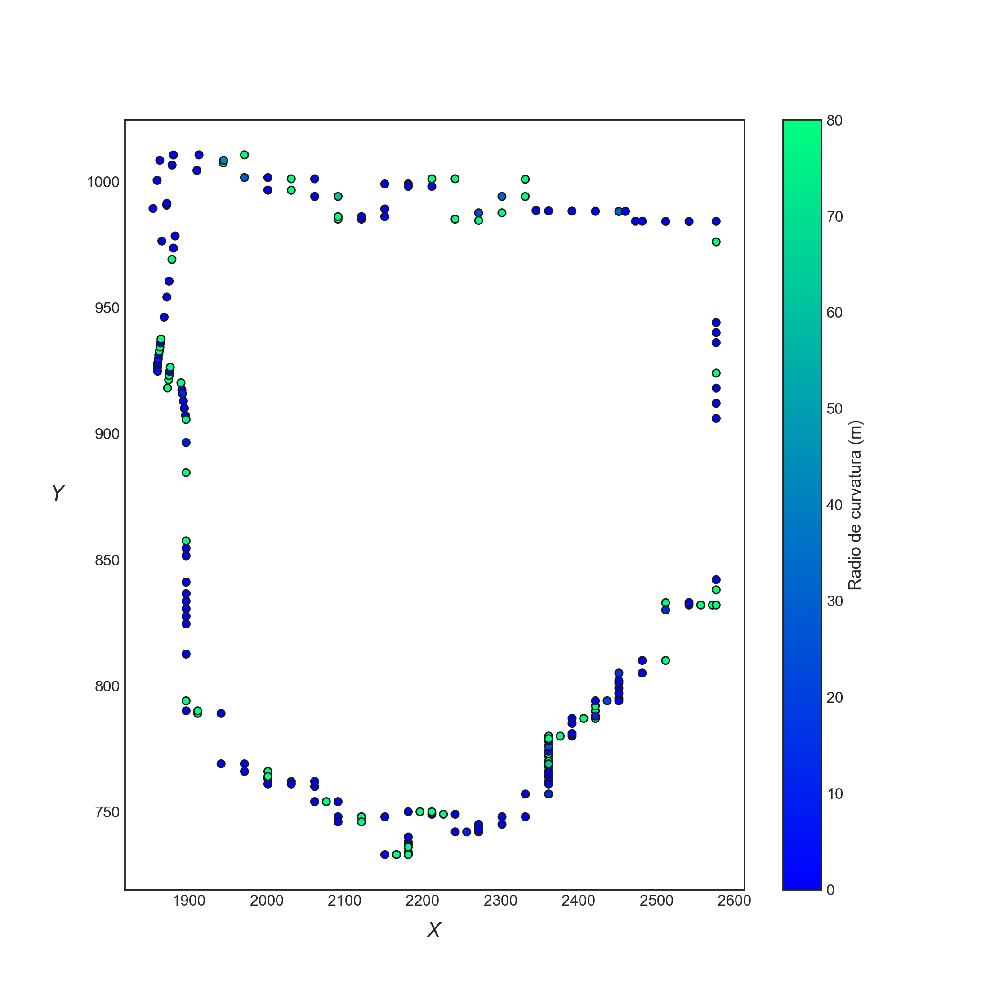

In [78]:
# Graficamos los resultados.
fig, ax = plt.subplots(figsize=(10, 10))
p = ax.scatter(
    curv_data.loc[idx, "X"], curv_data.loc[idx, "Y"], c=curv_data.loc[idx, "Radio de Curvatura"], 
    s=30, cmap="winter", vmin=0, vmax=80, edgecolor="k"
)
#ax.scatter(data["X"], data["Y"], marker="o", color="k", alpha=0.4)
ax.set_xlabel(r"$X$", labelpad=10, fontsize=15)
ax.set_ylabel(r"$Y$", labelpad=20, fontsize=15, rotation=0)
cbar = plt.colorbar(p)
cbar.set_label("Radio de curvatura (m)", fontsize=12);

Y eso es todo. Podemos observar que los puntos de mayor curvatura son aquellos donde el frente de hundimiento presenta un mayor cambio de dirección entre sus nodos, como cabría esperar. Tales puntos son los que demandan mayor atención, puesto que será ahí donde debemos generar estudios de consulta de esfuerzos (comúnmente mediante algún modelo numérico de esfuerzos) para verificar condiciones inducidas que puedan ser desfavorables para la actividad minera. ◼

## Interpolación multivariable.
Una vez introducidos los conceptos de interpolación polinomial y mediante splines, no hay problema en dar un paso más y extender estas ideas a casos multivariables. En este caso, estamos interesados en duplas del tipo $(\mathbf{x}_{i}, y_{i})_{i=0}^{n}\in \mathbb{R}^{m+1}$, donde $\mathbf{x}$ es un vector en $\mathbb{R}^{m}$. En general, las interpolaciones multivariables suelen dividirse en casos en los cuales los $n+1$ nodos de interpolación pueden o no conformar una grilla regular de puntos a lo largo y ancho de un dominio respectivo. Un caso particular de estas técnicas es muy familiar en el ámbito de la minería, y corresponde al método de Kriging, el cual suele verse en cursos de geoestadística.

### Interpolación sobre nodos uniformemente distribuidos.

En el módulo `scipy.interpolate` existen varias funciones y clases que nos permiten abordar este tipo de problemas. Una de ellas corresponde a `RegularGridInterpolation`, la que opera como sigue: Asumiendo que la interpolación se hará sobre una **grilla uniformemente distribuida** sobre el dominio de interés, esta clase solamente requiere de los límites de dicha grilla en la forma de secuencias de **Numpy**, los cuales se imputan en forma de tupla bajo el parámetro `points`, y los valores de interés evaluados sobre la grilla completa, bajo el parámetro `values`. Además, también disponemos de un parámetro `method` que nos permite especificar el método de interpolación a utilizar. En el siguiente ejemplo, haremos uso de una interpolación bidimensional de tercer orden o cúbica, usando el parámetro `method="cubic"`. Intentaremos aproximar la función exponencial bimodal

$$f(x,y)=\exp \left( -\left( x+\frac{1}{2} \right)^{2}  -2\left( y+\frac{1}{2} \right)^{2}  \right)  -\exp \left( -\left( x-\frac{1}{2} \right)^{2}  -2\left( y-\frac{1}{2} \right)^{2}  \right)$$
</p> <p style="text-align: right;">$(4.17)$</p>

Luego tenemos:

In [79]:
# Creamos los límites de la grilla.
x = np.linspace(start=-2, stop=2, num=10)
y = np.linspace(start=-2, stop=2, num=10)

In [80]:
# Creamos la función exponencial que trabajaremos sobre la grilla.
def f(x, y):
    return np.exp(-(x + 0.5)**2 - 2*(y + 0.5)**2) - np.exp(-(x - 0.5)**2 - 2*(y - 0.5)**2)

Ahora creamos la grilla completa que hará las funciones de nodos de interpolación y, por extensión, donde evaluaremos la función `f`. Para darle un poco más de dificultad al problema, añadiremos una cantidad moderada de ruido Gaussiano a las evaluaciones:

In [81]:
# Creamos la grilla completa.
X, Y = np.meshgrid(x, y)

In [82]:
# Simularemos algo de data con ruido Gaussiano sobre nuestra grilla.
rng = np.random.default_rng(seed=42)
Z = f(X, Y) + 0.05 * rng.random(size=X.shape)

Y ahora sí aplicamos nuestro interpolador. Como comentamos previamente, implementaremos uno del tipo cúbico. Recordemos que, para su aplicación, sólo basta usar como argumento en `points` los bordes originales de nuestra grilla, ya que la clase `RegularGridInterpolator` asume que los nodos que conforman la grilla completa están uniformemente distribuidos:

In [83]:
# Construimos nuestro interpolador.
I = interpolate.RegularGridInterpolator(points=(x, y), values=Z, method='cubic')

Ahora generaremos una grilla con mayor densidad de puntos, a fin de evaluar tanto la función original como el interpolador resultante, a modo de comparar gráficamente nuestros resultados:

In [84]:
# Generamos una grilla más densa para evaluar nuestro interpolador.
x_dense = np.linspace(start=x.min(), stop=x.max(), num=100)
y_dense = np.linspace(start=y.min(), stop=y.max(), num=100)

In [85]:
# Evaluamos nuestro interpolador en la grilla de alta densidad.
X_dense, Y_dense = np.meshgrid(x_dense, y_dense)
Z_dense = I((X_dense, Y_dense))

<IPython.core.display.Javascript object>


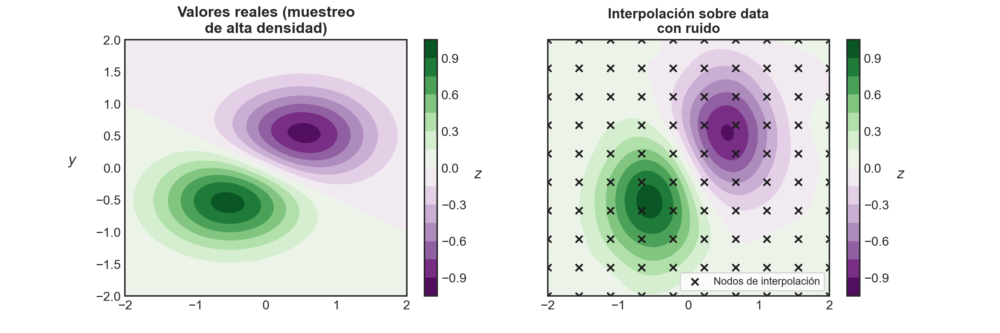

In [86]:
fig, ax = plt.subplots(1, 2, figsize=(12, 4), sharey=True)
c1 = ax[0].contourf(X_dense, Y_dense, f(X_dense, Y_dense), 15, cmap="PRGn")
ax[0].set_xlabel(r"$x$", fontsize=12, labelpad=20)
ax[0].set_ylabel(r"$y$", fontsize=12, rotation=0, labelpad=20)
ax[0].set_title("Valores reales (muestreo\nde alta densidad)", fontsize=13, fontweight="bold")
cb = fig.colorbar(c1, ax=ax[0])
cb.set_label(r"$z$", fontsize=12, labelpad=10, rotation=0)

c2 = ax[1].contourf(X_dense, Y_dense, Z_dense, 15, cmap="PRGn")
ax[1].set_ylim(-2.0, 2.0)
ax[1].set_xlim(-2.0, 2.0)
ax[1].set_xlabel(r"$x$", fontsize=12, labelpad=20)
#ax[1].set_ylabel(r"$y$", fontsize=12, rotation=0, labelpad=20)
ax[1].scatter(X, Y, marker='x', color='k', label="Nodos de interpolación")
ax[1].set_title("Interpolación sobre data\ncon ruido", fontsize=12, fontweight="bold")
ax[1].legend(fontsize=9, loc="lower right", frameon=True)
cb = fig.colorbar(c2, ax=ax[1])
cb.set_label(r"$z$", fontsize=12, labelpad=10, rotation=0)

Podemos observar que, si bien no es perfecta en términos espaciales, la interpolación que hemos construido *hace la pega*, ya que igualmente resulta en una función bimodal. Por supuesto, siempre podremos darnos el trabajo de comparar otros métodos de interpolación incluidos en la clase `RegularGridInterpolator`, a fin de comparar los resultados y quedarnos con el que mejor cumpla con resolver nuestro problema:

In [87]:
# Construimos distintos interpoladores
I1 = interpolate.RegularGridInterpolator(points=(x, y), values=Z, method='linear')
I2 = interpolate.RegularGridInterpolator(points=(x, y), values=Z, method='nearest')
I3 = interpolate.RegularGridInterpolator(points=(x, y), values=Z, method='slinear')
I4 = interpolate.RegularGridInterpolator(points=(x, y), values=Z, method='cubic')
I5 = interpolate.RegularGridInterpolator(points=(x, y), values=Z, method='quintic')
I6 = interpolate.RegularGridInterpolator(points=(x, y), values=Z, method='pchip')

<IPython.core.display.Javascript object>


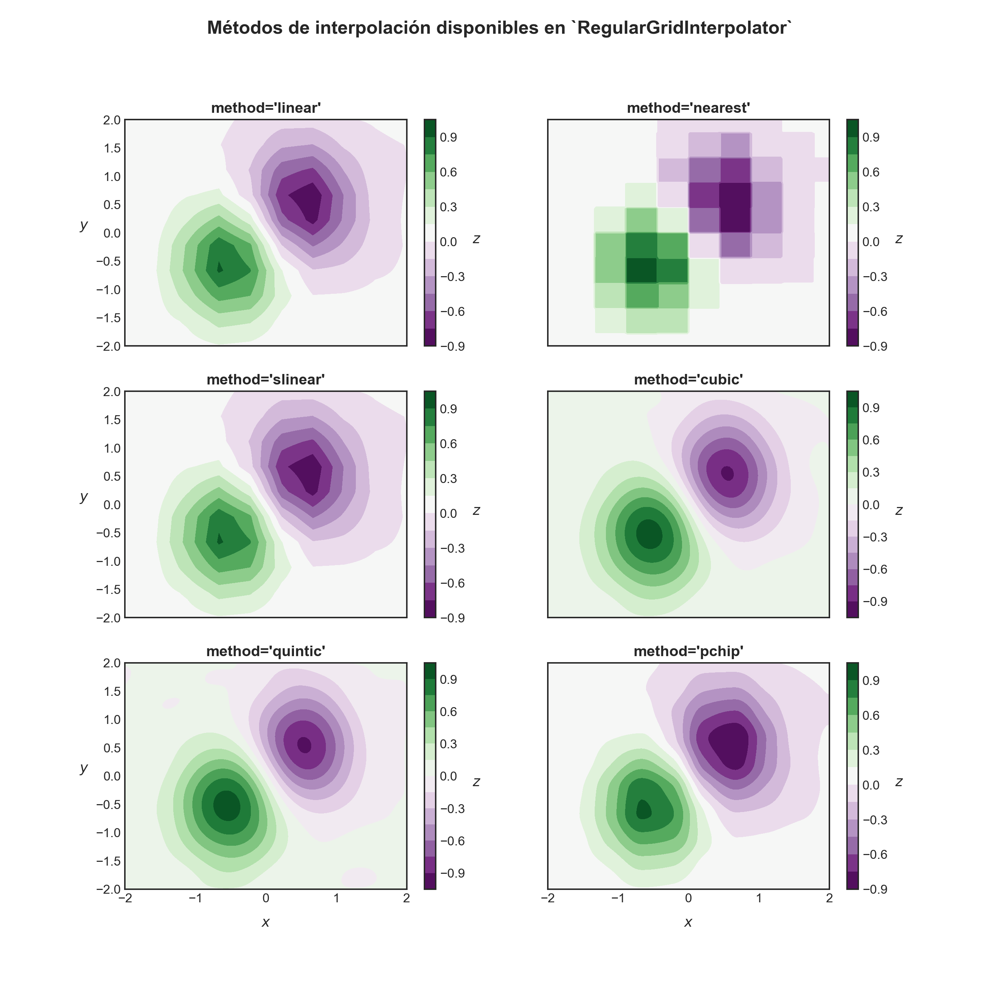

In [88]:
# Comparamos los distintos métodos disponibles en RegularGridInterpolator.
fig, ax = plt.subplots(3, 2, sharex=True, sharey=True, figsize=(12, 12))

c1 = ax[0, 0].contourf(X_dense, Y_dense, I1((X_dense, Y_dense)), 15, cmap="PRGn")
ax[0, 0].set_ylabel(r"$y$", fontsize=12, rotation=0, labelpad=10)
ax[0, 0].set_title("method='linear'", fontsize=13, fontweight="bold")
cb = fig.colorbar(c1, ax=ax[0, 0])
cb.set_label(r"$z$", fontsize=12, labelpad=10, rotation=0)

c2 = ax[0, 1].contourf(X_dense, Y_dense, I2((X_dense, Y_dense)), 15, cmap="PRGn")
ax[0, 1].set_title("method='nearest'", fontsize=13, fontweight="bold")
cb = fig.colorbar(c2, ax=ax[0, 1])
cb.set_label(r"$z$", fontsize=12, labelpad=10, rotation=0)

c3 = ax[1, 0].contourf(X_dense, Y_dense, I3((X_dense, Y_dense)), 15, cmap="PRGn")
ax[1, 0].set_ylabel(r"$y$", fontsize=12, rotation=0, labelpad=10)
ax[1, 0].set_title("method='slinear'", fontsize=13, fontweight="bold")
cb = fig.colorbar(c3, ax=ax[1, 0])
cb.set_label(r"$z$", fontsize=12, labelpad=10, rotation=0)

c4 = ax[1, 1].contourf(X_dense, Y_dense, I4((X_dense, Y_dense)), 15, cmap="PRGn")
ax[1, 1].set_title("method='cubic'", fontsize=13, fontweight="bold")
cb = fig.colorbar(c4, ax=ax[1, 1])
cb.set_label(r"$z$", fontsize=12, labelpad=10, rotation=0)

c5 = ax[2, 0].contourf(X_dense, Y_dense, I5((X_dense, Y_dense)), 15, cmap="PRGn")
ax[2, 0].set_xlabel(r"$x$", fontsize=12, labelpad=10)
ax[2, 0].set_ylabel(r"$y$", fontsize=12, rotation=0, labelpad=10)
ax[2, 0].set_title("method='quintic'", fontsize=13, fontweight="bold")
cb = fig.colorbar(c5, ax=ax[2, 0])
cb.set_label(r"$z$", fontsize=12, labelpad=10, rotation=0)

c6 = ax[2, 1].contourf(X_dense, Y_dense, I6((X_dense, Y_dense)), 15, cmap="PRGn")
ax[2, 1].set_xlabel(r"$x$", fontsize=12, labelpad=10)
ax[2, 1].set_title("method='pchip'", fontsize=13, fontweight="bold")
cb = fig.colorbar(c6, ax=ax[2, 1])
cb.set_label(r"$z$", fontsize=12, labelpad=10, rotation=0)

fig.suptitle(
    "Métodos de interpolación disponibles en `RegularGridInterpolator`",
    fontsize=16, fontweight="bold",
);

### Interpolación sobre nodos no uniformemente distribuidos.
Una situación, generalmente más común que la anterior, ocurre cuando los nodos sobre los cuales queremos construir un interpolador no se encuentran uniformemente distribuidos en el dominio de interés. Esto es frecuente, por ejemplo, a la hora de interpolar las propiedades de un yacimiento en función de los muestreos realizados a partir de un conjunto de sondajes, debido a que no es posible controlar la uniformidad de tales muestreos. Para problemas de este tipo, una función provista por el módulo `scipy.interpolate` que podemos aplicar rápidamente es `griddata()`, la cual puede trabajar con data no estructurada de manera uniforme.

La función `griddata()` tiene como primer argumento a `points`, que corresponde a una tupla `(Xd, Yd)` de arreglos unidimensionales con `n` observaciones y que se corresponden con los pares que representan los puntos $(x, y)$ que conforman la grilla; luego se tiene el argumento `values`, que hace referencia a los valores que resultan de la evaluación de la función original (digamos $f$) sobre la grilla. El último argumento es `xi`, y que corresponde a una tupla del tipo `(X, Y)`, con `m` observaciones, que van a hacer la función de *reestructurar* la grilla original `(Xd, Yd)`, por medio de otra grilla uniformemente distribuida, y que será donde finalmente se evaluará el interpolador resultante. Por supuesto, también disponemos de un parámetro opcional `method`, que nos permite establecer el tipo de interpolador a implementar (`"linear"`, `"nearest"` o `"cubic"`).

Es bueno mostrar el funcionamiento de la función `griddata()` por medio de un ejemplo. Para ello, usaremos como generador la función multimodal $f$ definida como

$$f\left( x,y\right)  =\exp \left( -x^{2}-y^{2}\right)  \mathrm{sen} \left( 5y\right)  \cos \left( 7x\right)$$
</p> <p style="text-align: right;">$(4.18)$</p>

Y evaluada sobre el conjunto $S=\left\{ \left( x,y\right)  \in \mathbb{R}^{2} :-1\leq x\leq 1;-1\leq y\leq 1\right\}$. Para construir la grilla no uniforme, seleccionaremos algunos puntos $(x, y)$ aleatoriamente en $S$. Los puntos $(x, y, z)$ son luego utilizados como nodos de interpolación y el interpolador evaluado posteriormente sobre una grilla uniforme que genera la región $S$. Para ello, primero definiremos la función (4.18) en Python:

In [89]:
# Definimos la función (4.18).
def f(x, y):
    return np.exp(-x**2 - y**2) * np.sin(5*y) * np.cos(7*x)

In [90]:
from typing import Callable

In [91]:
# Y también una función generadora de la grilla completa en S.
def grid_generator(
    fun: Callable,
    N: int,
    random_state: float,
) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    
    rng = np.random.default_rng(seed=random_state)
    Xd = rng.uniform(low=-1, high=1, size=N)
    Yd = rng.uniform(low=-1, high=1, size=N)
    Zd = f(Xd, Yd)
    
    return Xd, Yd, Zd

In [92]:
# Generamos la grilla no uniforme.
Xd, Yd, Zd = grid_generator(fun=f, N=500, random_state=42)

In [93]:
# Ahora generaremos la grilla uniforme donde se evaluará el interpolador.
x = np.linspace(start=-1, stop=1, num=100)
y = np.linspace(start=-1, stop=1, num=100)
X, Y = np.meshgrid(x, y)
Z = f(X, Y)

<IPython.core.display.Javascript object>


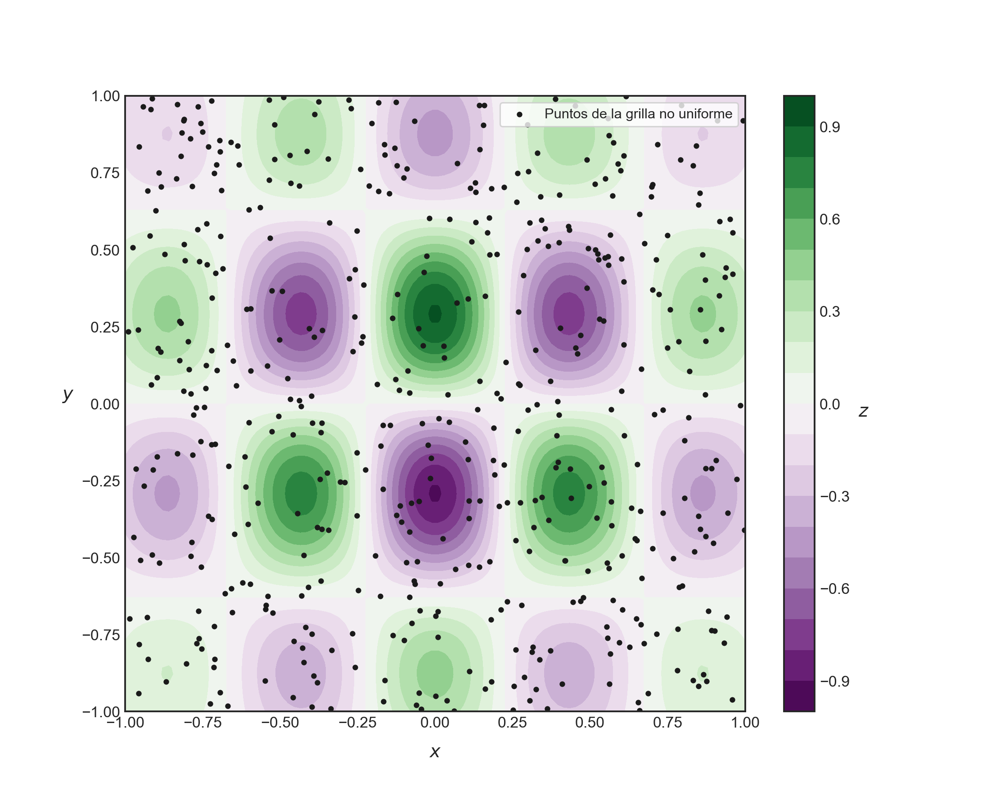

In [94]:
# Y la visualizaremos a fin de tener una idea respecto al problema completo.
fig, ax = plt.subplots(figsize=(10, 8))
p = ax.contourf(X, Y, Z, 20, cmap="PRGn")
ax.scatter(x=Xd, y=Yd, marker=".", color="k", label="Puntos de la grilla no uniforme")
ax.legend(loc="upper right", fontsize=10, frameon=True)
ax.set_xlabel(r"$x$", labelpad=10, fontsize=13)
ax.set_ylabel(r"$y$", labelpad=10, fontsize=13, rotation=0)
cb = fig.colorbar(p, ax=ax)
cb.set_label(r"$z$", fontsize=13, rotation=0, labelpad=10);

A partir del gráfico anterior podemos observar que los puntos generados aleatoriamente cubren bastante bien el dominio de interés donde queremos realizar la interpolación, cuando el número de puntos generados es igual a 500. Por lo tanto, debería ser plausible la reconstrucción de la función original $f$ por medio de un interpolador de manera más o menos precisa.

Para comparar la acción de los diferentes interpoladores, construiremos nuevamente una grilla de gráficos, pero esta vez haremos variar igualmente el número de puntos de muestreo, a fin de notar su efecto en el resultado final. Específicamente, veremos que ocurre cuando interpolamos sobre una grilla no uniforme compuesta por 125, 250 y 500 puntos en total, distribuidos sobre $S$:

<IPython.core.display.Javascript object>


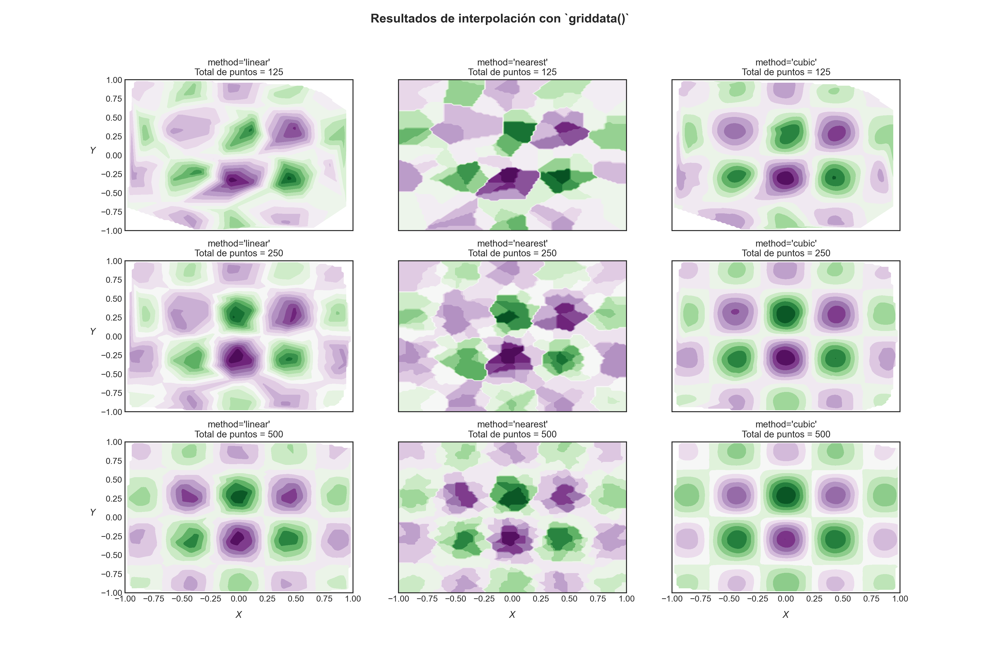

In [95]:
# Construimos las interpolaciones y graficamos sus resultados.
fig, ax = plt.subplots(3, 3, figsize=(18, 12), sharey=True, sharex=True)

n_points = [125, 250, 500]
for i, n in enumerate(n_points):
    G1 = interpolate.griddata(points=(Xd[:n], Yd[:n]), values=Zd[:n], xi=(X, Y), method="linear")
    G2 = interpolate.griddata(points=(Xd[:n], Yd[:n]), values=Zd[:n], xi=(X, Y), method="nearest")
    G3 = interpolate.griddata(points=(Xd[:n], Yd[:n]), values=Zd[:n], xi=(X, Y), method="cubic")
    
    p0 = ax[i, 0].contourf(X, Y, G1, 15, cmap="PRGn")
    ax[i, 0].set_ylabel(r"$Y$", fontsize=12, labelpad=10, rotation=0)
    ax[i, 0].set_title(f"method='linear'\nTotal de puntos = {n}")
    
    p1 = ax[i, 1].contourf(X, Y, G2, 15, cmap="PRGn")
    ax[i, 1].set_title(f"method='nearest'\nTotal de puntos = {n}")
    
    p2 = ax[i, 2].contourf(X, Y, G3, 15, cmap="PRGn")
    ax[i, 2].set_title(f"method='cubic'\nTotal de puntos = {n}")
    
for j in range(len(n_points)):
    ax[2, j].set_xlabel(r"$X$", fontsize=12, labelpad=10)

fig.suptitle("Resultados de interpolación con `griddata()`", fontsize=16, fontweight="bold");

La figura anterior nos permite comprobar que, siempre que dispongamos de una cantidad suficiente de puntos muestreados de una función, tal que podamos cubrir *decentemente* el dominio de interés, es posible reconstruir una función desconocida a partir de un interpolador. Puntualmente, podemos observar que la interpolación bivariable cúbica entrega resultados muy superiores en calidad a los obtenidos mediante métodos lineales (`method="linear"`) y de vecinos más cercanos (`method="nearest"`), aunque por supuesto, resulte computacionalmente más costosa:

In [96]:
%timeit G1 = interpolate.griddata(points=(Xd[:n], Yd[:n]), values=Zd[:n], xi=(X, Y), method="linear")
%timeit G2 = interpolate.griddata(points=(Xd[:n], Yd[:n]), values=Zd[:n], xi=(X, Y), method="nearest")
%timeit G3 = interpolate.griddata(points=(Xd[:n], Yd[:n]), values=Zd[:n], xi=(X, Y), method="cubic")

4.17 ms ± 155 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)
4.74 ms ± 149 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)
5.74 ms ± 219 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


**Ejemplo 4.4 - La interpolación como base de un modelo de bloques**: Vamos a abordar un problema muy común en el campo de la planificación minera (o más concretamente, de la geoestadística), y que corresponde a la construcción de una estimación de leyes de cobre en un yacimiento a partir de los datos de exploración obtenidos mediante una campaña de sondajes de diamantina. Tales sondajes tienen la misión de obtener una determinada cantidad de muestras de roca que nos permiten, con algo de esfuerzo, mapear en primera instancia la calidad y el volumen de nuestro yacimiento.

Como ya es costumbre, el dataset a utilizar se encuentra disponible en la carpeta correspondiente a esta sección. Puntualmente, haremos uso del archivo `datasets/probing_grades.csv`, el cual corresponde a un DataFrame que contiene las coordenadas $(x, y, z)$ de los puntos de muestreo de más de 2400 sondajes de diamantina, y sobre los cuales, mediante pruebas de laboratorio, se han obtenido estimaciones de las leyes de cobre de un depósito mineral de interés.

Empezamos pues accediendo a nuestro archivo:

In [97]:
# Acceso a la data.
data = pd.read_csv("datasets/probing_grades.csv", sep=";")

In [98]:
# Imprimos las primeras filas de esta data para conocer su estructura.
data.head()

,X,Y,Z,Cu
0,267.6,105.5,97.4,3.97
1,160.4,133.1,131.0,3.96
2,163.5,166.5,123.4,3.28
3,178.9,134.9,131.0,3.88
4,178.9,134.9,119.0,3.92


Observamos que el dataset es sencillamente un DataFrame de **Pandas** con cuatro columnas: Tres que nos entregan la información espacial de cada punto de muestreo, y una que nos indica la medición realizada por medio de pruebas de laboratorio de la ley de cobre asociada a cada punto.

Para obtener una visualización completa de la campaña, construiremos un gráfico interactivo que nos permita rotar y manipular la figura resultante incluso en el repositorio. Para ello, haremos uso de la librería **Plotly**, la que no hemos aprendido en nuestra asignatura, pero que resulta bastante sencilla de entender en la práctica. En este caso, haremos uso del módulo de alto nivel `plotly.express` (usualmente importando por medio del alias `px`), y usaemos la función `scatter_3d()` a fin de obtener un gráfico de dispersión con todos los puntos muestreados, donde el color de cada uno representará la ley de cobre medida. El módulo `plotly.express` posee funcionalidades que lo hacen altamente compatible con estructuras de datos de **Pandas**, y que permiten reconocer varias de sus componentes. En particular, la función `scatter_3d()` acepta, entre otros, los siguentes argumentos:

- `data_frame`: El DataFrame de **Pandas** que contiene la data, digamos $(x, y, z)$, que queremos graficar.
- `x`: La primera coordenada de la data que deseamos graficar. Esta se expresa como un string que coincide con el rótulo de columna asociado en el DataFrame correspondiente.
- `y`: La segunda coordenada de la data que queremos graficar, con las mismas consideraciones anteriores.
- `z`: La tercera coordenada de la data que queremos graficar, con las mismas consideraciones anteriores.
- `color`: Los valores de la propiedad asociada a los puntos $(x, y, z)$ de interés (en nuestro caso, las leyes de cobre).
- `color_continuous_scale`: El mapa de color que usaremos para representar las variaciones de la propiedad asociada a los puntos $(x, y, z)$ graficados. En general, **Plotly** acepta los mismos mapas de color que **Matplotlib**, aunque existen unos pocos que son exclusivos de cada librería.
- `opacity`: Número entre 0 y 1 que representa la transparencia de cada punto (similar a `alpha` en **Matplotlib**).
- `size`: Tamaño asociado a cada punto graficado, y que se corresponde igualmente con una columna del DataFrame de interés.

Luego tenemos:

In [99]:
import plotly.express as px
import plotly.io as pio

Debido a que Github no tiene soporte para figuras completamente interactivas, no podremos ver, en el repositorio de nuestra asignatura, los gráficos resultantes de **Plotly**. Sin embargo, los guardaremos en un archivo `html` para poder verlos y manipularlos cuanto queramos. Además, si abrimos este notebook en la URL https://nbviewer.org/, la que nos permite ver cualquier notebook público de un repositorio de Github sin las restricciones propias de la plataforma, sí que podremos ver cualquier figura que construyamos en **Plotly** (verificar, en este caso, la URL https://nbviewer.org/github/rquezadac/udd_data_analytics_lectures/blob/main/Seccion%204%20-%20Analisis%20numericos%20y%20simbolicos%20con%20Scipy%20y%20Sympy/clase_4_4.ipynb.

Y, ahora sí, ya procedemos a construir nuestro gráfico:

In [100]:
# Gráfico de puntos que nos permitirá conocer la extensión volumétrica de la campaña.
fig = px.scatter_3d(
    data_frame=data, x="X", y="Y", z="Z", color="Cu", color_continuous_scale="Spectral_r",
    opacity=0.7, size="Cu"
)
fig.update_layout(
    title="Extensión espacial de sondajes", width=1000, height=800,
    title_font_size=20
)

También haremos uso de **Matplotlib** para obtener gráficos de las proyecciones de estos sondajes en los planos $XY$, $XZ$ e $YZ$:

<IPython.core.display.Javascript object>


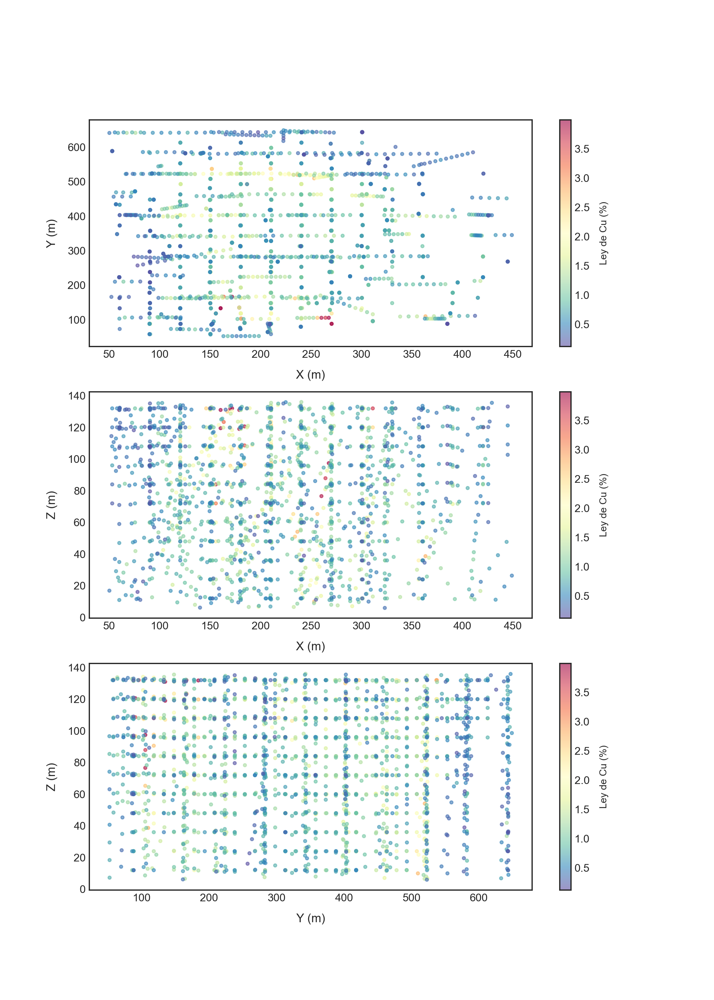

In [101]:
# Panel de gráficos con las proyecciones de la campaña en los planos XY, XZ e YZ.
fig, ax = plt.subplots(nrows=3, figsize=(10, 14))

p1 = ax[0].scatter(data["X"], data["Y"], c=data["Cu"], cmap="Spectral_r", s=10, alpha=0.6)
cb1 = plt.colorbar(p1, ax=ax[0])
cb1.set_label("Ley de Cu (%)", fontsize=10, labelpad=10)
ax[0].set_xlabel("X (m)", labelpad=10, fontsize=12)
ax[0].set_ylabel("Y (m)", labelpad=10, fontsize=12)

p2 = ax[1].scatter(data["X"], data["Z"], c=data["Cu"], cmap="Spectral_r", s=10, alpha=0.6)
cb2 = plt.colorbar(p1, ax=ax[1])
cb2.set_label("Ley de Cu (%)", fontsize=10, labelpad=10)
ax[1].set_xlabel("X (m)", labelpad=10, fontsize=12)
ax[1].set_ylabel("Z (m)", labelpad=10, fontsize=12)

p3 = ax[2].scatter(data["Y"], data["Z"], c=data["Cu"], cmap="Spectral_r", s=10, alpha=0.6)
cb3 = plt.colorbar(p1, ax=ax[2])
cb3.set_label("Ley de Cu (%)", fontsize=10, labelpad=10)
ax[2].set_xlabel("Y (m)", labelpad=10, fontsize=12)
ax[2].set_ylabel("Z (m)", labelpad=10, fontsize=12);

Los gráficos anteriores nos permiten tener una idea de la extensión volumétrica del depósito de interés. Además, podemos verificar que los muestreos que caracterizan a esta campaña completa constituyen una grilla que no es espacialmente uniforme, pero que cubre más o menos bien el volumen de interés. 

Vamos a construir un modelo que nos permitirá estimar las leyes en una grilla completamente uniforme que recubra toda la extensión de la campaña de sondajes, considerando un espaciamiento de 10 metros en todas las dimensiones espaciales. El resultado de ésto podrá ser fácilmente aplicado para construir un modelo de leyes con bloques de 10$\times$10$\times$10 metros. Por supuesto, esto es un problema de interpolación con dominio en $\mathbb{R}^{4}$ sobre data no uniforme, similar a los anteriores. La gran diferencia es que, en esta ocasión, la función `interpolate.griddata()` no nos servirá, porque el resultado del objeto resultante de la misma es el resultado de la interpolación, y nosotros necesitamos en este caso un `Callable` que nos permita estimar leyes en cualquier punto interior al volumen donde está limitado el interpolador. Por esa razón, haremos uso de un **interpolador de base radial** (**RBF**, del inglés *radial basis function*) con kernel de tipo cúbico, disponible en el módulo `scipy.interpolate`.

Una función de base radial es una función $\phi$ que depende únicamente de la distancia de un punto arbitrario y otro punto fijo (que muchas veces es el origen del sistema de coordenadas). En términos formales (y más o menos generales), la función $\Phi:\mathbb{R}^{m}\longrightarrow \mathbb{R}$ es llamada de base radial, si existe otra función $\phi:[0, +\infty)\longrightarrow \mathbb{R}$, llamada kernel, tal que $\Phi(\mathbf{x})=\phi(r)$, donde $r=\left\Vert \mathbf{x} -\mathbf{c} \right\Vert$, siendo $\left\Vert \cdot \right\Vert$ es alguna norma sobre $\mathbb{R}^{m}$ (típicamente la norma Euclidiana).

El concepto de kernel es similar al que vimos previamente al estudiar la estimación de funciones de densidad, y existen varios que podemos implementar. Por ejemplo, un kernel de tipo *cúbico* se define como

$$\phi \left( r\right)  =\left( \mathbf{x}^{\top } \mathbf{c} +\gamma \right)^{3}$$
</p> <p style="text-align: right;">$(4.19)$</p>

Y existen muchos otros.

Las funciones de base radial pueden utilizarse para construir interpoladores de alta precisión y complejidad para todo tipo de data no uniformemente espaciada en un espacio incluso de muchas dimensiones. Estos interpoladores tienen la forma de una suma ponderada similar a la ilustrada en la Ec. (4.1), donde las *funciones base* son reemplazadas por estas funciones de base radial. Por ejemplo, si queremos construir un interpolador para una serie de $n+1$ puntos $\left\{ \left( x_{i},y_{i}\right)  \right\}^{n+1}_{i=1}$, para una función de base radial $\phi(r)$, ésto nos llevaría a una suma del tipo

$$s\left( x\right)  =\sum^{n+1}_{i=1} w_{i}\phi \left( \left\Vert x-x_{i}\right\Vert  \right)$$
</p> <p style="text-align: right;">$(4.20)$</p>

Donde $w_{i}$ son los ponderadores que queremos determinar. En notación matricial, la ecuación (4.20) puede reescribirse como

$$\left( \begin{array}{cccc}\phi \left( \left\Vert x_{1}-x_{1}\right\Vert  \right)  &\phi \left( \left\Vert x_{2}-x_{1}\right\Vert  \right)  &\cdots &\phi \left( \left\Vert x_{n+1}-x_{1}\right\Vert  \right)  \\ \phi \left( \left\Vert x_{1}-x_{2}\right\Vert  \right)  &\phi \left( \left\Vert x_{2}-x_{2}\right\Vert  \right)  &\cdots &\phi \left( \left\Vert x_{n+1}-x_{2}\right\Vert  \right)  \\ \vdots &\vdots &\ddots &\vdots \\ \phi \left( \left\Vert x_{1}-x_{n+1}\right\Vert  \right)  &\phi \left( \left\Vert x_{2}-x_{n+1}\right\Vert  \right)  &\cdots &\phi \left( \left\Vert x_{n+1}-x_{n+1}\right\Vert  \right)  \end{array} \right)  \left( \begin{array}{c}w_{1}\\ w_{2}\\ \vdots \\ w_{n+1}\end{array} \right)  =\left( \begin{array}{c}y_{1}\\ y_{2}\\ \vdots \\ y_{n+1}\end{array} \right)$$
</p> <p style="text-align: right;">$(4.21)$</p>

En este ejercicio en particular, construiremos nuestro modelo de leyes haciendo uso de un kernel de tipo cúbico como el definido en (4.19). Para ello, usaremos la clase `Rbf` del módulo `scipy.interpolate`, la cual acepta una tupla de dimensión arbitraria que representará los puntos de interés sobre los cuales construiremos el interpolador, y que no tienen por qué ser uniformes. Debemos definir igualmente el tipo de kernel a utilizar por medio del parámetro `function`, y que, como comentamos previamente, será de tipo cúbico, por lo que setearemos este parámetro en `"cubic"`:

In [102]:
# Extraemos los valores muestreados.
Xd, Yd, Zd, Cud = data["X"].values, data["Y"].values, data["Z"].values, data["Cu"].values

In [103]:
# Generamos la grilla uniforme de puntos donde evaluaremos nuestro interpolador.
# La grilla tendrá un espaciamiento de 10 metros en todas dimensiones.
x = np.arange(start=Xd.min(), stop=Xd.max() + 10, step=10)
y = np.arange(start=Yd.min(), stop=Yd.max() + 10, step=10)
z = np.arange(start=Zd.min(), stop=Zd.max() + 10, step=10)
X, Y, Z = np.meshgrid(x, y, z)

In [104]:
# Construimos nuestro interpolador.
rbf_interpolator = interpolate.Rbf(Xd, Yd, Zd, Cud, function="cubic")

El interpolador resultante, almacenado en la variable `rbf_interpolator`, es de tipo `Callable`, por lo que puede ser usado para estimar las leyes de cobre en cualquier punto interior al dominio de interpolación:

In [105]:
# Estimamos las leyes en la grilla uniforme.
Cu_estimate = rbf_interpolator(X, Y, Z)

La estimación tendrá las mismas dimensiones que los subelementos que conforman la grilla, lo que en nuestro caso es un arreglo tridimensional:

In [106]:
# Geometría de la estimación.
Cu_estimate.shape

Para facilitar el trabajo de construir una visualización adecuada, *aplanaremos* la grilla completa y las estimaciones, a fin de llevarnos todo a un DataFrame de **Pandas** y graficar nuestras estimaciones nuevamente mediante el uso de **Plotly**. Dado que las leyes originales se mueven entre 0% y 4% de cobre, eliminaremos además cualquier estimación hecha por el interpolador que esté fuera de dicho rango (anulando las negativas, y eliminando las muy altas):

In [107]:
# Generamos un DataFrame con toda esta nueva información aplanando el arreglo 3D resultante.
X_flattened, Y_flattened, Z_flattened = X.ravel(), Y.ravel(), Z.ravel()
Cu_uniform_estimate = Cu_estimate.ravel()
data_estimate = pd.DataFrame(
    {"X": X_flattened, "Y": Y_flattened, "Z": Z_flattened, "Cu": Cu_uniform_estimate}
)

In [108]:
# Anulamos cualquier registro negativo y eliminamos los registros con leyes demasiado grandes.
data_estimate["Cu"] = np.where(data_estimate["Cu"] >= 4, np.nan, data_estimate["Cu"])
data_estimate["Cu"] = np.where(data_estimate["Cu"] < 0, 0, data_estimate["Cu"])

Y ya podemos graficar nuestros resultados:

In [109]:
# Gráfico de puntos que nos permitirá conocer la extensión volumétrica de la campaña.
fig = px.scatter_3d(
    data_frame=data_estimate, x="X", y="Y", z="Z", color="Cu", color_continuous_scale="Spectral_r",
    opacity=0.3
)
fig.update_layout(
    title="Estimación por medio de una interpolación de base radial cúbica 3D", width=1000, height=800,
    title_font_size=20
)

<IPython.core.display.Javascript object>


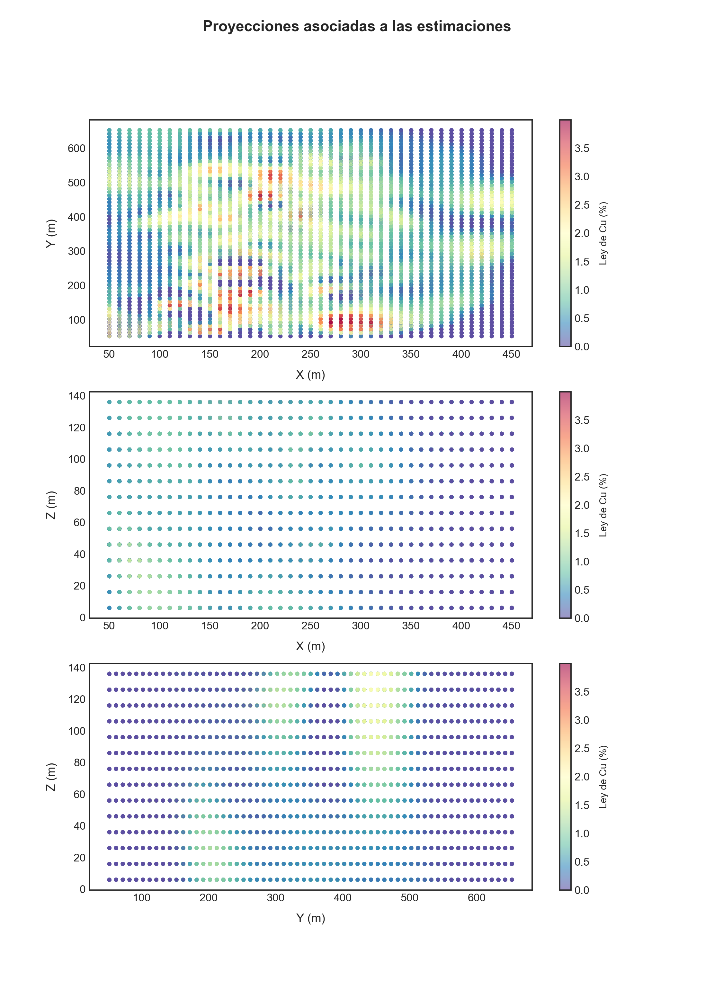

In [110]:
# Panel de gráficos con las proyecciones de la estimación en los planos XY, XZ e YZ.
fig, ax = plt.subplots(nrows=3, figsize=(10, 14))

p1 = ax[0].scatter(
    data_estimate["X"], data_estimate["Y"], c=data_estimate["Cu"], cmap="Spectral_r", s=10, alpha=0.6
)
cb1 = plt.colorbar(p1, ax=ax[0])
cb1.set_label("Ley de Cu (%)", fontsize=10, labelpad=10)
ax[0].set_xlabel("X (m)", labelpad=10, fontsize=12)
ax[0].set_ylabel("Y (m)", labelpad=10, fontsize=12)

p2 = ax[1].scatter(
    data_estimate["X"], data_estimate["Z"], c=data_estimate["Cu"], cmap="Spectral_r", s=10, alpha=0.6
)
cb2 = plt.colorbar(p2, ax=ax[1])
cb2.set_label("Ley de Cu (%)", fontsize=10, labelpad=10)
ax[1].set_xlabel("X (m)", labelpad=10, fontsize=12)
ax[1].set_ylabel("Z (m)", labelpad=10, fontsize=12)

p3 = ax[2].scatter(
    data_estimate["Y"], data_estimate["Z"], c=data_estimate["Cu"], cmap="Spectral_r", s=10, alpha=0.6
)
cb3 = plt.colorbar(p3, ax=ax[2])
cb3.set_label("Ley de Cu (%)", fontsize=10, labelpad=10)
ax[2].set_xlabel("Y (m)", labelpad=10, fontsize=12)
ax[2].set_ylabel("Z (m)", labelpad=10, fontsize=12)

fig.suptitle("Proyecciones asociadas a las estimaciones", fontsize=15, fontweight="bold");

Es posible obtener visualizaciones más suavizadas por *capas* o cotas, tomando como base cada plano definido por los distintos valores de $z$ en la grilla completa. Para ello, podemos utilizar un interpolador por splines sencillo disponible en el módulo de triangulación de **Matplotlib**, llamado `matplotlib.triangulation` (y que suele importarse por medio del alias `tri`).

Al igual que los interpoladores disponibles en `scipy.interpolate`, el módulo `matplotlib.triangulation` dispone de varias funciones que nos permiten construir interpolaciones de órdenes diferentes. En este pequeño ejemplo, usaremos un interpolador de orden cúbico construido sobre la grilla definida por tres valores distintos de $z$ en las estimaciones finales de leyes obtenidas previamente:

In [111]:
import matplotlib.tri as tri

In [112]:
def plot_grade_estimation(data: pd.DataFrame, z: float, ax):
    """
    Una función sencilla que nos permite construir un gráfico de contorno para las estimaciones
    suavizadas de leyes de cobre obtenidas previamente en cada una de las cotas o planos
    definidos por cada valor dado de Z.
    
    Parámetros:
    -----------
    data : El DataFrame donde almacenamos la información. Notemos que dicho DataFrame debe tener
    las columnas "X", "Y", "Z" y "Cu".
    z : Número de punto flotante que define la cota a la cual mostramos las estimaciones sobre el
    plano XY.
    
    """
    # Capturamos toda la información referida al plano de interés.
    plane = data_estimate[data_estimate["Z"] == z].copy()
    
    # Realizamos la triangulación de todos los puntos (x, y) de la grilla.
    triangulator = tri.Triangulation(plane["X"], plane["Y"])
    
    # Realizamos la interpolación.
    estimator = tri.CubicTriInterpolator(triangulator, plane["Cu"])
    
    # Explicitamos la grilla sobre la que estimamos las leyes.
    xi = np.linspace(start=plane["X"].min(), stop=plane["X"].max(), num=100)
    yi = np.linspace(start=plane["Y"].min(), stop=plane["Y"].max(), num=100)
    Xi, Yi = np.meshgrid(xi, yi)
    cui = estimator(Xi, Yi)
    
    # Y finalmente construimos el gráfico.
    p = ax.contourf(xi, yi, cui, levels=20, cmap="Spectral_r")
    cb = plt.colorbar(p, ax=ax)
    cb.set_label("Ley estimada Cu (%)", labelpad=10)
    #ax.set_xlabel("X (m)", fontsize=13, labelpad=10)
    #ax.set_ylabel("Y (m)", fontsize=13, labelpad=20, rotation=0)
    ax.set_title(
        f"Estimación para cota Z = {np.around(z, 3)} m", 
        fontsize=15, fontweight="bold", pad=10
    );

Y ya podemos construir nuestros gráficos. En este caso, elegiremos los valores $z=6$, $z=16$, $z=26$ y $z=36$:

<IPython.core.display.Javascript object>


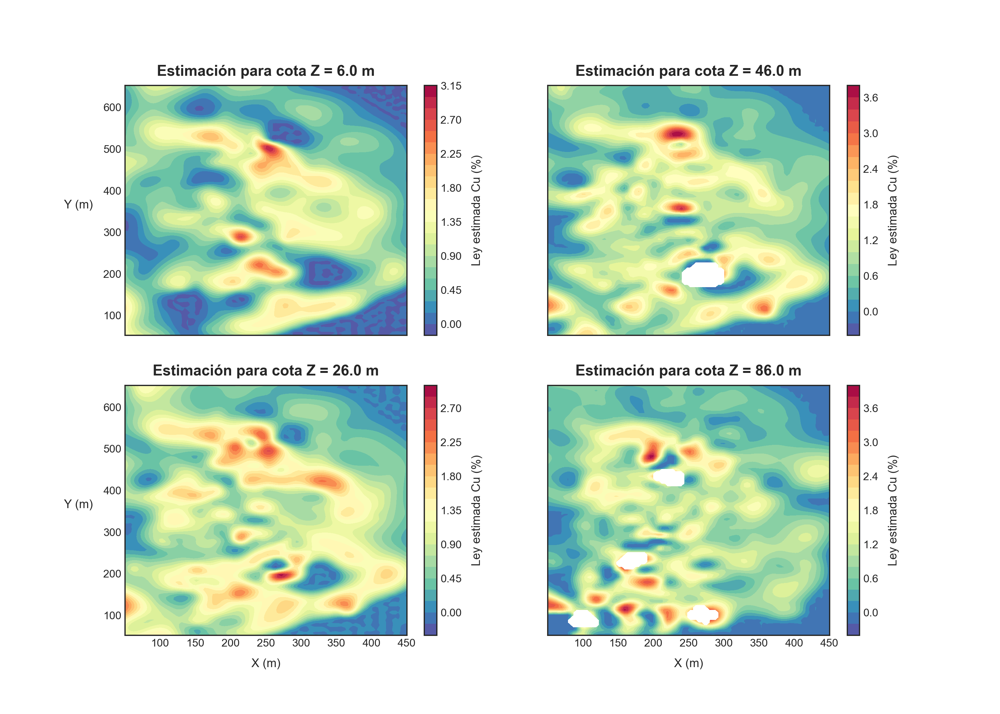

In [113]:
# Panel de gráficos para algunos valores de Z.
fig, ax = plt.subplots(figsize=(14, 10), nrows=2, ncols=2, sharex=True, sharey=True)

plot_grade_estimation(data_estimate, z=6.0, ax=ax[0, 0])
plot_grade_estimation(data_estimate, z=26.0, ax=ax[1, 0])
plot_grade_estimation(data_estimate, z=46.0, ax=ax[0, 1])
plot_grade_estimation(data_estimate, z=86.0, ax=ax[1, 1])

ax[1, 0].set_xlabel("X (m)", fontsize=12, labelpad=10)
ax[1, 1].set_xlabel("X (m)", fontsize=12, labelpad=10)
ax[0, 0].set_ylabel("Y (m)", fontsize=12, labelpad=25, rotation=0)
ax[1, 0].set_ylabel("Y (m)", fontsize=12, labelpad=25, rotation=0);

Podemos observar que la interpolación que hemos realizado ha hecho un trabajo más que aceptable para construir un modelo regularizado de leyes a partir de nuestros datos de la campaña de sondajes, aunque por supuesto se observan regiones donde no disponemos de data para tener estimaciones. Sin embargo, esto no es más que una aproximación un tanto burda y que puede servir como caso base de un trabajo más acabado que considere efectos de influencia entre las leyes y variogramas asociados. Pero en definitiva, no deja de ser una primera aproximación de calidad más que aceptable. ◼

## Comentarios finales.
Los contenidos revisados en esta sección son útiles para la reconstrucción de funciones desconocidas por medio de funciones construidas *a gusto del modelador*, siempre que se cumplan ciertas condiciones mínimas en función de la cantidad y calidad de la información disponible relativa a un problema. Como siempre, tales condiciones no siempre serán controlables, y muchas veces requerirán mejoramientos en los métodos experimentales y de muestreo asociados a la obtención de cierta cantidad de data. Estamos lejos aún de métodos verdaderamente generativos... ¡Pero este es un primer paso importante!